In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import os.path
from pathlib import Path
import albumentations as A
import cv2
import scipy
import scipy.io
from scipy.ndimage import gaussian_filter
import keras
from keras.optimizers import RMSprop,Adam,Optimizer,Optimizer, SGD
from keras.callbacks import ModelCheckpoint
from keras import metrics
import tensorflow as tf
import h5py
from sklearn.model_selection import train_test_split
import random
from PIL import Image
from keras.layers import Conv2D, MaxPooling2D, Concatenate, Input
from keras.models import Model
from keras.models import load_model
from math import ceil
from keras.callbacks import Callback, ModelCheckpoint
import csv

In [3]:
aug_train = A.Compose([
    A.Resize(768, 1024),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(),
    A.Normalize((0.5), (0.5)),
], keypoint_params=A.KeypointParams(format='xy', angle_in_degrees=False))

aug_val = A.Compose([
    A.Resize(768 , 1024),
    A.Normalize((0.5), (0.5)),
], keypoint_params=A.KeypointParams(format='xy', angle_in_degrees=False))

aug_val_test = A.Compose([
    A.Normalize((0.5), (0.5))
], keypoint_params=A.KeypointParams(format='xy', angle_in_degrees=False))


/opt/conda/lib/python3.10/site-packages/albumentations/core/composition.py:191: UserWarning: Got processor for keypoints, but no transform to process it.
  self._set_keys()


In [4]:
train_A = [p.path for p in os.scandir('/kaggle/input/shanghaitech/ShanghaiTech/part_A/train_data/images')]
valid_A = [p.path for p in os.scandir('/kaggle/input/shanghaitech/ShanghaiTech/part_A/test_data/images')]

# Set a seed for reproducibility
random.seed(42)  
random.shuffle(valid_A)
# Calculate the split index
split_index = ceil(len(valid_A) * 0.9)

# Split the data
valid_A_split = valid_A[:split_index]  # 90% for validation
test_A_split = valid_A[split_index:]  # 10% for testing

train_B = [p.path for p in os.scandir('/kaggle/input/shanghaitech/ShanghaiTech/part_B/train_data/images')]
valid_B = [p.path for p in os.scandir('/kaggle/input/shanghaitech/ShanghaiTech/part_B/test_data/images')]

# Set a seed for reproducibility
random.seed(42)  
random.shuffle(valid_B)
# Calculate the split index
split_index = ceil(len(valid_B) * 0.9)

# Split the data
valid_B_split = valid_B[:split_index]  # 90% for validation
test_B_split = valid_B[split_index:]  # 10% for testing

# Create a list of file paths for images in the UCF_CC_50 directory that end with .jpg extension
UCF_CC_50_IMG = [p.path for p in os.scandir('/kaggle/input/ucf-cc-50-with-people-density-map/UCF_CC_50') if p.name.endswith('.jpg')]

# Create a list of file paths for images in the Mall dataset directory that end with .jpg extension
Mall_Dataset = [p.path for p in os.scandir('/kaggle/input/mall-dataset/frames/frames') if p.name.endswith('.jpg')]

# Sort the files based on the numeric part of the filename (seq_xxxxxx.jpg)
Mall_Dataset.sort(key=lambda x: int(x.split('/')[-1].split('_')[-1].split('.')[0]))


In [4]:
len(train_A), len(valid_A_split), len(test_A_split)

(300, 164, 18)

In [5]:
len(train_B), len(valid_B_split), len(test_B_split)

(400, 285, 31)

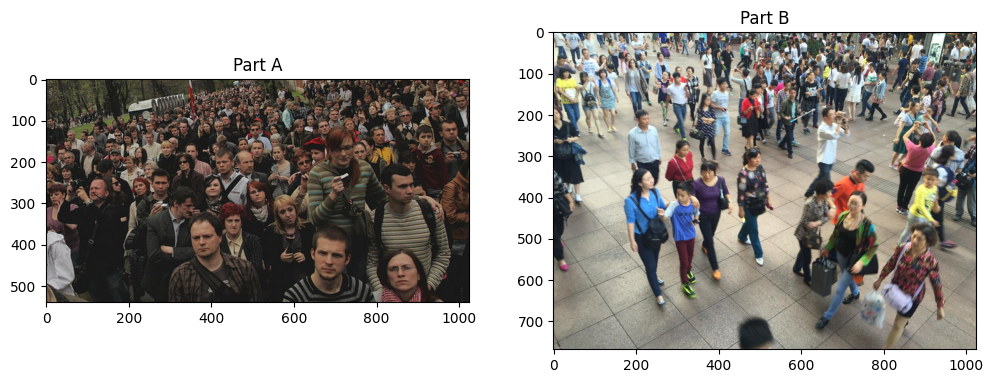

In [6]:
im = cv2.imread(train_A[0], cv2.IMREAD_COLOR)
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
im2 = cv2.imread(train_B[0], cv2.IMREAD_COLOR)
im2 = cv2.cvtColor(im2, cv2.COLOR_BGR2RGB)

f, axarr = plt.subplots(1, 2, figsize=(12, 12))
axarr[0].imshow(im, cmap='gray')
axarr[0].title.set_text('Part A')
axarr[1].imshow(im2, cmap='gray')
axarr[1].title.set_text('Part B')

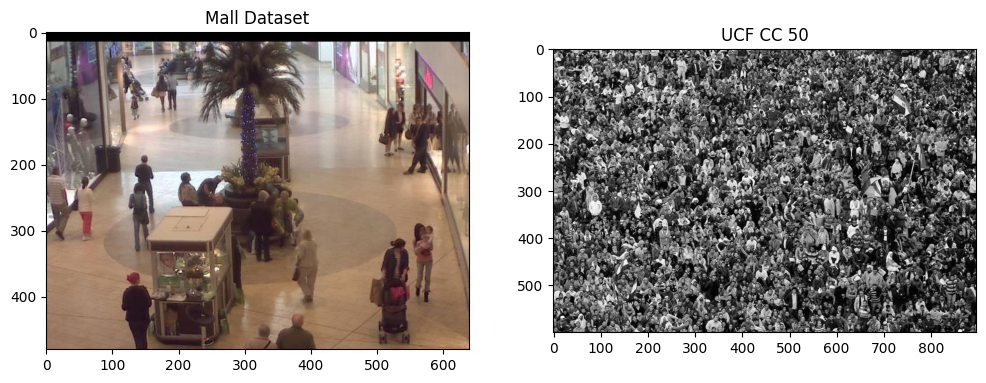

In [7]:
im = cv2.imread(Mall_Dataset[0], cv2.IMREAD_COLOR)
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
im2 = cv2.imread(UCF_CC_50_IMG[0], cv2.IMREAD_COLOR)

f, axarr = plt.subplots(1, 2, figsize=(12, 12))
axarr[0].imshow(im, cmap='gray')
axarr[0].title.set_text('Mall Dataset')
axarr[1].imshow(im2, cmap='gray')
axarr[1].title.set_text('UCF CC 50')

In [8]:
# Initialize an empty list to store the number of people in each image
sum_img = []

# Combine the training and validation datasets into one list (combined_A)
combined_A = train_A + valid_A

# Loop through each item in the combined dataset
for count in range(len(combined_A)):
  # Get the file path for the current image
  tmp_file =combined_A[count]
    
  # Load the corresponding ground truth .mat file
  m = scipy.io.loadmat(tmp_file.replace('images', 'ground-truth').replace('IMG', 'GT_IMG').replace('.jpg', '.mat'))
  
  # Extract the list of people density map data (stored in the 'image_info' field)
  ps = m['image_info'][0][0][0][0][0]
    
  # Get the length of the list (which represents the number of people in the image)  
  dm = len(ps)
    
  # Append the number of people (dm) to the sum_img list  
  sum_img.append(dm)

# Calculate the mean number of people in the images by dividing the total by the number of images
meanA = sum(sum_img) / len(sum_img)

print(meanA)

500.57053941908714


In [9]:
# Initialize an empty list to store the number of people in each image
sum_img = []

# Combine the training and validation datasets into one list (combined_A)
combined_B = train_B + valid_B

# Loop through each item in the combined dataset
for count in range (len(combined_B)):
  # Get the file path for the current image  
  tmp_file =combined_B[count]

  # Load the corresponding ground truth .mat file 
  m = scipy.io.loadmat(tmp_file.replace('images', 'ground-truth').replace('IMG', 'GT_IMG').replace('.jpg', '.mat'))

  # Extract the list of people density map data (stored in the 'image_info' field)  
  ps = m['image_info'][0][0][0][0][0]

  # Get the length of the list (which represents the number of people in the image)  
  dm = len(ps)

  # Append the number of people (dm) to the sum_img list  
  sum_img.append(dm)

# Calculate the mean number of people in the images by dividing the total by the number of images
meanB = sum(sum_img) / len(sum_img)

print(meanB)

123.28491620111731


In [10]:
# Initialize an empty list to store the number of people in each image
sum_img = []

# Loop through each item in the combined dataset
for count in range(len(UCF_CC_50_IMG)):
  # Get the file path for the current image  
  tmp_file =UCF_CC_50_IMG[count]  

  # Load the corresponding ground truth .mat file  
  m = scipy.io.loadmat(tmp_file.replace('UCF_CC_50 (img only)', 'UCF_CC_50 (GT only)').replace('.jpg', '_ann.mat'))

  # Extract the list of people density map data (stored in the 'annPoints' field)  
  ps = m["annPoints"]

  # Get the length of the list (which represents the number of people in the image)  
  dm = len(ps)

  # Append the number of people (dm) to the sum_img list  
  sum_img.append(dm)

# Calculate the mean number of people in the images by dividing the total by the number of images
meanUCF = sum(sum_img) / len(sum_img)

print(meanUCF)

1279.48


In [11]:
# Initialize an empty list to store the number of people in each image
sum_img = []

# Loop through each item in the combined dataset
for count in range(len(Mall_Dataset)):
    # Get the file path for the current image
    tmp_file =Mall_Dataset[count]

    # Load the corresponding ground truth .mat file
    m = scipy.io.loadmat('/kaggle/input/mall-dataset/mall_gt.mat')

    # Extract the list of people density map data (stored in the 'frame' field)
    # Index [0][count] refers to the specific frame corresponding to the current image
    ps = m['frame'][0][count][0][0][0]

    # Get the length of the list (which represents the number of people in the image)
    dm = len(ps)

    # Append the number of people (dm) to the sum_img list
    sum_img.append(dm)

# Calculate the mean number of people in the images by dividing the total by the number of images
meanMALL = sum(sum_img) / len(sum_img)

print(meanMALL)

31.1575


In [12]:
print("Average number of people per image in Part A: ", meanA)
print("Average number of people per image in Part B: ", meanB)
print("Average number of people per image in UCF CC 50: ", meanUCF)
print("Average number of people per image in Mall Dataset: ", meanMALL)

Average number of people per image in Part A:  500.57053941908714
Average number of people per image in Part B:  123.28491620111731
Average number of people per image in UCF CC 50:  1279.48
Average number of people per image in Mall Dataset:  31.1575


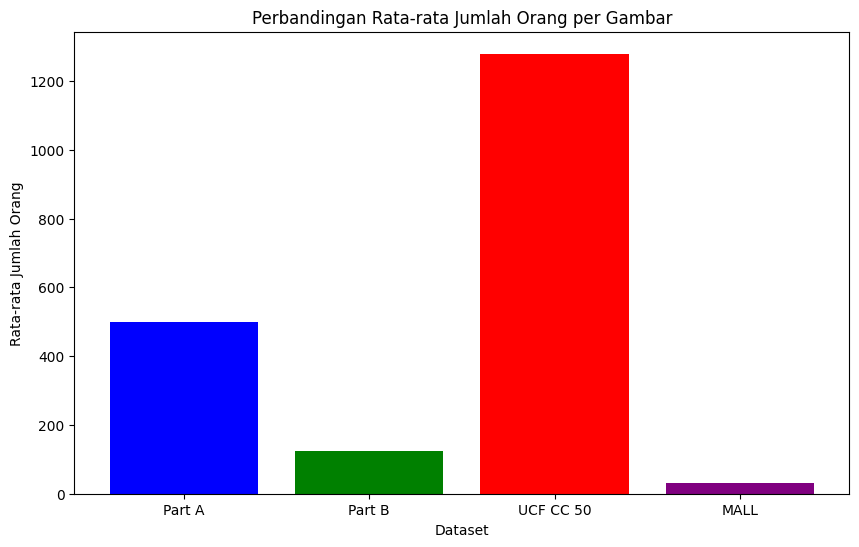

In [13]:
# Labels and values for the datasets
datasets = ['Part A', 'Part B', 'UCF CC 50', 'MALL']
mean_values = [meanA, meanB, meanUCF, meanMALL]

# Create a bar graph
plt.figure(figsize=(10, 6))
plt.bar(datasets, mean_values, color=['blue', 'green', 'red', 'purple'])

# Add labels and title
plt.xlabel('Dataset')
plt.ylabel('Rata-rata Jumlah Orang')
plt.title('Perbandingan Rata-rata Jumlah Orang per Gambar')

# Show the graph
plt.show()

In [14]:
# Load the corresponding ground truth .mat file for the first image in the train_A list
m = scipy.io.loadmat(train_A[0].replace('images', 'ground-truth').replace('IMG', 'GT_IMG').replace('.jpg', '.mat'))

# Print the loaded .mat data
print(m)

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Fri Nov 18 20:06:08 2016', '__version__': '1.0', '__globals__': [], 'image_info': array([[array([[(array([[  25.99681609,  280.90289066],
                       [  49.01929898,  234.85792487],
                       [   6.97824326,  234.85792487],
                       [  14.9860634 ,  100.72693758],
                       [  64.03396174,  134.76017316],
                       [  91.0603547 ,  138.76408323],
                       [ 121.08968021,  123.74942047],
                       [ 113.08186008,  148.7738584 ],
                       [ 104.07306242,  165.79047619],
                       [  56.0261416 ,  162.78754364],
                       [  38.00854629,  183.8080715 ],
                       [  55.02516408,  197.82175674],
                       [ 154.12193828,  164.78949867],
                       [ 170.13757855,  187.81198157],
                       [ 147.11509566,  225.84912722],
                       

In [15]:
# Load the corresponding ground truth .mat file for the first image in the train_A list
m = scipy.io.loadmat(train_A[0].replace('images', 'ground-truth').replace('IMG', 'GT_IMG').replace('.jpg', '.mat'))

# Extract the people density map data from the 'image_info' field in the .mat file
# This 'ps' variable contains the list of (x, y) coordinates representing people in the image
ps = m['image_info'][0][0][0][0][0]

# Print the extracted people density map data
print(ps)

[[  25.99681609  280.90289066]
 [  49.01929898  234.85792487]
 [   6.97824326  234.85792487]
 [  14.9860634   100.72693758]
 [  64.03396174  134.76017316]
 [  91.0603547   138.76408323]
 [ 121.08968021  123.74942047]
 [ 113.08186008  148.7738584 ]
 [ 104.07306242  165.79047619]
 [  56.0261416   162.78754364]
 [  38.00854629  183.8080715 ]
 [  55.02516408  197.82175674]
 [ 154.12193828  164.78949867]
 [ 170.13757855  187.81198157]
 [ 147.11509566  225.84912722]
 [ 168.13562352  258.88138528]
 [ 129.09750035  275.89800307]
 [ 225.19134199  266.88920542]
 [ 251.21675744  222.84619467]
 [ 286.25097053  263.88627287]
 [ 195.16201648  206.83055439]
 [ 223.18938696  180.80513895]
 [ 293.25781315  171.79634129]
 [ 310.27443095  155.78070102]
 [ 354.3174417   176.80122888]
 [ 339.30277894  205.82957687]
 [ 336.29984639  312.93417121]
 [ 384.34676721  385.00455244]
 [ 454.41519341  352.97327189]
 [ 402.36436252  261.88431783]
 [ 429.39075548  209.83348694]
 [ 488.44842899  206.83055439]
 [ 517.4

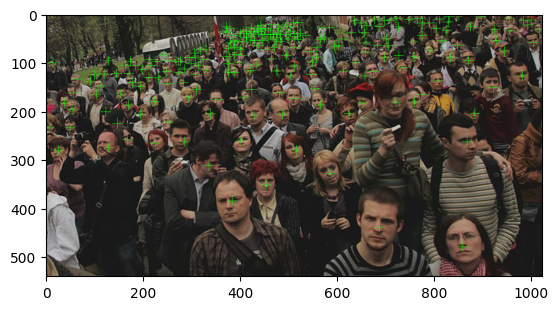

In [16]:
# Read the image using OpenCV in color mode (BGR format by default)
im = cv2.imread(train_A[0], cv2.IMREAD_COLOR)

# Convert the image from BGR to RGB color format for correct display in matplotlib
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

# Load the corresponding ground truth .mat file for the first image in the train_A list
m = scipy.io.loadmat(train_A[0].replace('images', 'ground-truth').replace('IMG', 'GT_IMG').replace('.jpg', '.mat'))

# Extract the people density map data from the 'image_info' field in the .mat file
# This 'ps' variable contains the list of (x, y) coordinates representing people in the image
ps = m['image_info'][0][0][0][0][0]

# Loop through each (x, y) coordinate in the people density map (ps)
# These coordinates represent the positions of people in the image
for x, y in ps:
    # Convert x and y coordinates to integers (since pixel positions must be integer values)
    x = int(x)
    y = int(y)

    # Draw a marker on the image at the (x, y) position with green color (0, 255, 0)
    # The marker will indicate the location of a person in the image
    cv2.drawMarker(im, (x, y), (0, 255, 0))
    
plt.imshow(im)

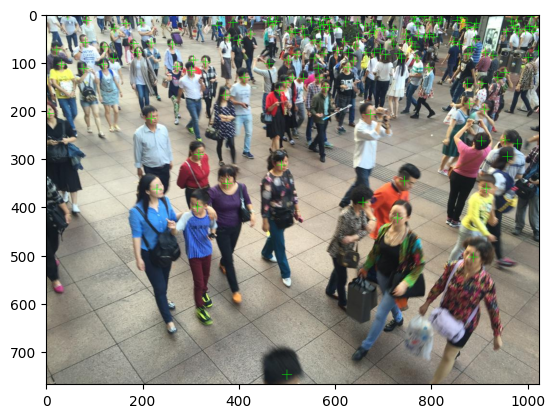

In [17]:
# Read the image using OpenCV in color mode (BGR format by default)
im = cv2.imread(train_B[0], cv2.IMREAD_COLOR)

# Convert the image from BGR to RGB color format for correct display in matplotlib
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

# Load the corresponding ground truth .mat file for the first image in the train_A list
m = scipy.io.loadmat(train_B[0].replace('images', 'ground-truth').replace('IMG', 'GT_IMG').replace('.jpg', '.mat'))

# Extract the people density map data from the 'image_info' field in the .mat file
# This 'ps' variable contains the list of (x, y) coordinates representing people in the image
ps = m['image_info'][0][0][0][0][0]

# Loop through each (x, y) coordinate in the people density map (ps)
# These coordinates represent the positions of people in the image
for x, y in ps:
    # Convert x and y coordinates to integers (since pixel positions must be integer values)
    x = int(x)
    y = int(y)

    # Draw a marker on the image at the (x, y) position with green color (0, 255, 0)
    # The marker will indicate the location of a person in the image
    cv2.drawMarker(im, (x, y), (0, 255, 0))
    
plt.imshow(im)

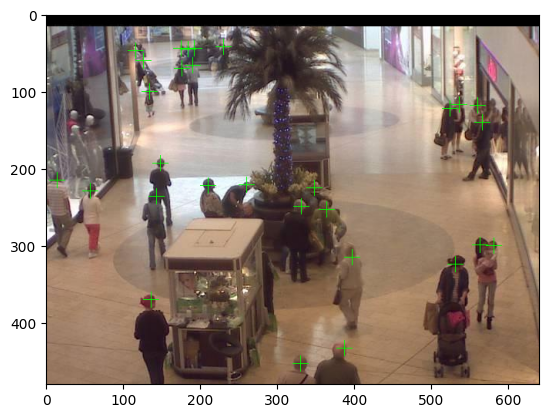

In [18]:
# Read the image using OpenCV in color mode (BGR format by default)
im = cv2.imread(Mall_Dataset[0], cv2.IMREAD_COLOR)

# Convert the image from BGR to RGB color format for correct display in matplotlib
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

# Load the corresponding ground truth .mat file for the first image in the train_A list
m = scipy.io.loadmat('/kaggle/input/mall-dataset/mall_gt.mat')

# Extract the people density map data from the 'frame' field in the .mat file
# This 'ps' variable contains the list of (x, y) coordinates representing people in the image
ps = m['frame'][0][0][0][0][0]

# Loop through each (x, y) coordinate in the people density map (ps)
# These coordinates represent the positions of people in the image
for x, y in ps:
    # Convert x and y coordinates to integers (since pixel positions must be integer values)
    x = int(x)
    y = int(y)

    # Draw a marker on the image at the (x, y) position with green color (0, 255, 0)
    # The marker will indicate the location of a person in the image
    cv2.drawMarker(im, (x, y), (0, 255, 0))
    
plt.imshow(im)

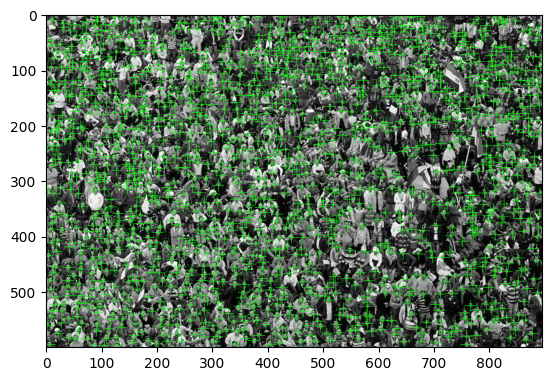

In [19]:
# Function to clip keypoints (coordinates) to ensure they stay within the image boundaries
# - keypoints: List of (x, y) coordinates
# - img_width, img_height: The width and height of the image
def clip_keypoints(keypoints, img_width, img_height):
    # Clip the x-coordinate to stay between 0 and img_width - 1 (image width)
    keypoints[:, 0] = np.clip(keypoints[:, 0], 0, img_width - 1)  # Clip x-coordinate
    # Clip the y-coordinate to stay between 0 and img_height - 1 (image height)
    keypoints[:, 1] = np.clip(keypoints[:, 1], 0, img_height - 1)  # Clip y-coordinate
    return keypoints


# Read the image (first image in UCF_CC_50_IMG list) using OpenCV in color mode
im = cv2.imread(UCF_CC_50_IMG[0], cv2.IMREAD_COLOR)

# Convert the image from BGR to RGB color format for correct display with matplotlib
im = cv2.cvtColor(im, cv2.COLOR_BGR2RGB)

# Load the corresponding ground truth annotation file (.mat) for the first image
m = scipy.io.loadmat(UCF_CC_50_IMG[0].replace('.jpg', '_ann.mat'))

# Extract the annotation points (keypoints) from the loaded .mat file
ps = m["annPoints"]

# Convert the list of annotation points to a numpy array for easier processing
ps = np.array(ps)

# Clip the keypoints to ensure they stay within the image boundaries (0, img_width-1) for x and (0, img_height-1) for y
ps = clip_keypoints(ps, img_width=im.shape[1], img_height=im.shape[0])  # Ensure they stay within bounds

# Loop through each (x, y) coordinate in the clipped keypoints
# These coordinates represent the positions of annotated points in the image
for x, y in ps:
    # Convert x and y coordinates to integers as pixel positions must be integers
    x = int(x)
    y = int(y)
    
    # Draw a green marker (color: (0, 255, 0)) on the image at the (x, y) position
    # The marker represents a point of interest in the image (e.g., a person or feature)
    cv2.drawMarker(im, (x, y), (0, 255, 0))
    
plt.imshow(im)

In [5]:
class DatasetA(keras.utils.Sequence):
    def __init__(self, files, aug):
        self.files = files
        self.aug = aug
        
    def __len__(self):
        return len(self.files)
        
    def __getitem__(self, idx):
        fn = self.files[idx]

        im = cv2.imread(fn, cv2.IMREAD_COLOR)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

        m = scipy.io.loadmat(fn.replace('images', 'ground-truth').replace('IMG', 'GT_IMG').replace('.jpg', '.mat'))
        ps = m['image_info'][0][0][0][0][0]

        rst = self.aug(image=im, keypoints=ps)
        im = rst['image']
        ps = rst['keypoints']

        dm = np.zeros((im.shape[0], im.shape[1]), dtype=np.float32)
        for x, y in ps:
            x = int(x)
            y = int(y)
            dm[y, x] = 1

        sigma = 4
        dm = gaussian_filter(dm, sigma=sigma, truncate=4*sigma)

        ht = im.shape[0]
        wd = im.shape[1]

        ht_1 = int((ht // 4))
        wd_1 = int((wd // 4))

        dm = cv2.resize(dm, (wd_1, ht_1), interpolation=cv2.INTER_LINEAR)
        dm *= 16

        return im, dm

In [6]:
class DatasetB(keras.utils.Sequence):
    def __init__(self, files, aug):
        self.files = files
        self.aug = aug
        
    def __len__(self):
        return len(self.files)
        
    def __getitem__(self, idx):
        fn = self.files[idx]

        im = cv2.imread(fn, cv2.IMREAD_COLOR)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

        m = scipy.io.loadmat(fn.replace('images', 'ground-truth').replace('IMG', 'GT_IMG').replace('.jpg', '.mat'))
        ps = m['image_info'][0][0][0][0][0]

        rst = self.aug(image=im, keypoints=ps)
        im = rst['image']
        ps = rst['keypoints']

        dm = np.zeros((im.shape[0], im.shape[1]), dtype=np.float32)
        for x, y in ps:
            x = int(x)
            y = int(y)
            dm[y, x] = 1

        sigma = 15
        dm = gaussian_filter(dm, sigma=sigma)

        ht = im.shape[0]
        wd = im.shape[1]

        ht_1 = int((ht // 4))
        wd_1 = int((wd // 4))

        dm = cv2.resize(dm, (wd_1, ht_1), interpolation=cv2.INTER_LINEAR)
        dm *= 16

        return im, dm

In [6]:
class MALL_DATASET(keras.utils.Sequence):
    def __init__(self, files, aug):
        self.files = files
        self.aug = aug

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        fn = self.files[idx]

        im = cv2.imread(fn, cv2.IMREAD_COLOR)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

        m = scipy.io.loadmat('/kaggle/input/mall-dataset/mall_gt.mat')

        ps = m['frame'][0][idx][0][0][0]

        rst = self.aug(image=im, keypoints=ps)
        im = rst["image"]
        ps = rst['keypoints']

        dm = np.zeros((im.shape[0], im.shape[1]), dtype=np.float32)
        for x, y in ps:
            x = int(x)
            y = int(y)
            dm[y, x] = 1

        sigma = 4
        dm = gaussian_filter(dm, sigma=sigma, truncate=4*sigma)

        ht = im.shape[0]
        wd = im.shape[1]

        ht_1 = int((ht // 4))
        wd_1 = int((wd // 4))

        dm = cv2.resize(dm, (wd_1, ht_1), interpolation=cv2.INTER_LINEAR)
        dm *= 16

        return im, dm

In [23]:
def clip_keypoints(keypoints, img_width, img_height):
    keypoints[:, 0] = np.clip(keypoints[:, 0], 0, img_width - 1)  # Clip x-coordinate
    keypoints[:, 1] = np.clip(keypoints[:, 1], 0, img_height - 1)  # Clip y-coordinate
    return keypoints


class UCF_CC_50(keras.utils.Sequence):
    def __init__(self, files, aug):
        self.files = files
        self.aug = aug

    def __len__(self):
        return len(self.files)

    def __getitem__(self, idx):
        fn = self.files[idx]

        im = cv2.imread(fn, cv2.IMREAD_COLOR)
        im = cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

        m = scipy.io.loadmat(fn.replace('UCF_CC_50 (img only)', 'UCF_CC_50 (GT only)').replace('.jpg', '_ann.mat'))

        ps = m["annPoints"]
        ps = np.array(ps)
        ps = clip_keypoints(ps, img_width=im.shape[1], img_height=im.shape[0])  # Ensure they stay within bounds
        
        rst = self.aug(image=im, keypoints=ps)
        im = rst["image"]
        ps = rst['keypoints']

        dm = np.zeros((im.shape[0], im.shape[1]), dtype=np.float32)
        for x, y in ps:
            x = int(x)
            y = int(y)
            dm[y, x] = 1

        sigma = 4
        dm = gaussian_filter(dm, sigma=sigma, truncate=4*sigma)

        ht = im.shape[0]
        wd = im.shape[1]

        ht_1 = int((ht // 4))
        wd_1 = int((wd // 4))

        dm = cv2.resize(dm, (wd_1, ht_1), interpolation=cv2.INTER_LINEAR)
        dm *= 16
        
        return im, dm

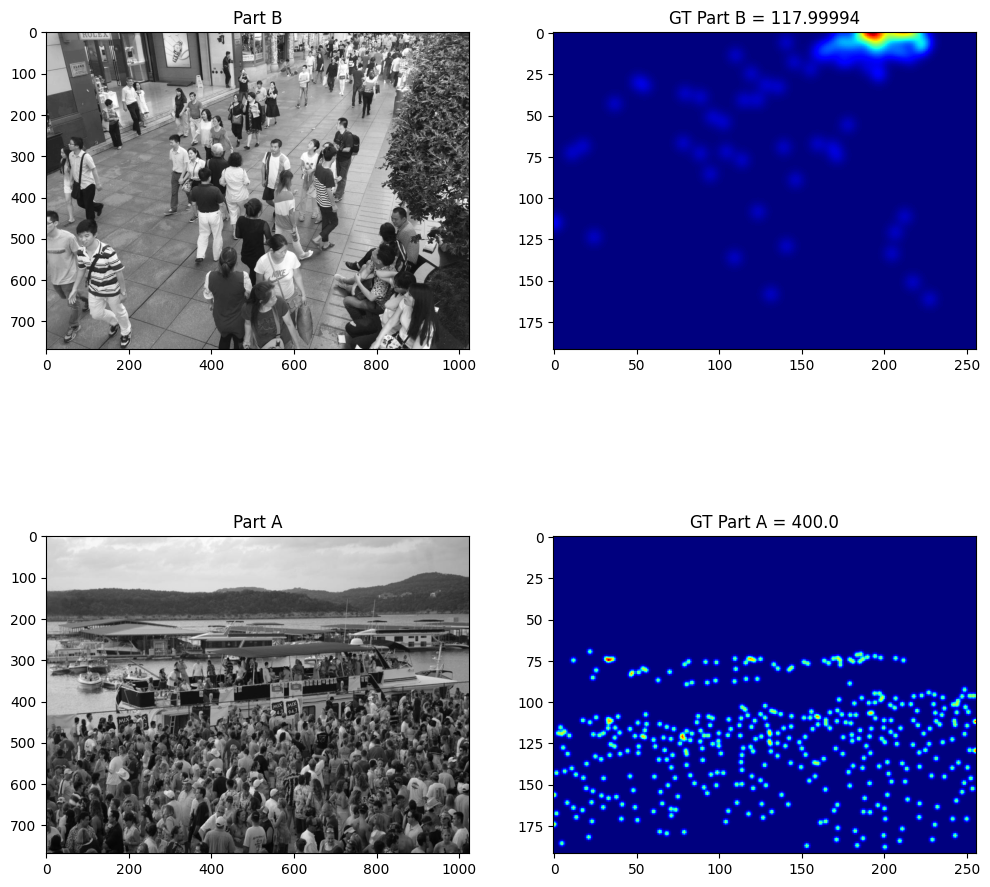

In [24]:
number1 = random.randint(0, 399)
number2 = random.randint(0, 299)

ds = DatasetB(train_B, aug_train)
im, dm = ds[number1]
fs = DatasetA(train_A, aug_train)
im2, dm2 = fs[number2]
f, axarr = plt.subplots(2, 2, figsize=(12, 12))
axarr[0,0].imshow(im, cmap='gray')
axarr[0,1].imshow(dm, cmap='jet')
axarr[1,0].imshow(im2, cmap='gray')
axarr[1,1].imshow(dm2, cmap='jet')
axarr[0,0].title.set_text('Part B')
axarr[0,1].title.set_text('GT Part B = '+str(dm.sum()))
axarr[1,0].title.set_text('Part A')
axarr[1,1].title.set_text('GT Part A = '+str(dm2.sum()))

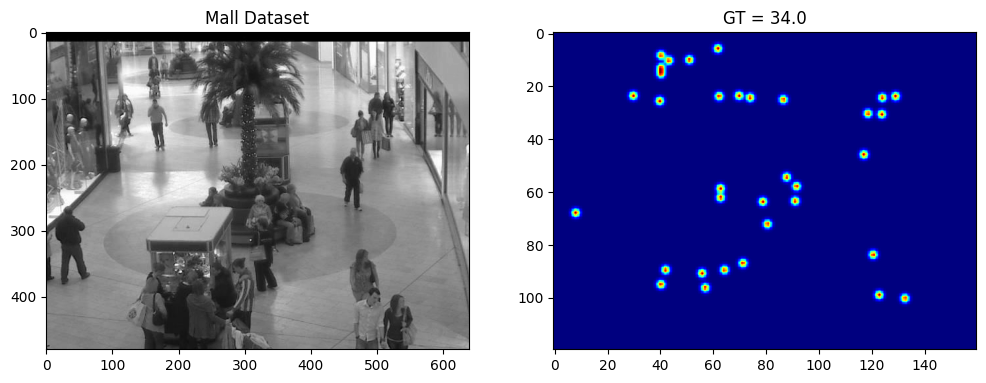

In [25]:
number = random.randint(0, 1999)

gs = MALL_DATASET(Mall_Dataset, aug_val_test)
im, dm = gs[number]

f, axarr = plt.subplots(1, 2, figsize=(12, 12))
axarr[0].imshow(im, cmap='gray')
axarr[0].title.set_text('Mall Dataset')
axarr[1].imshow(dm, cmap='jet')
axarr[1].title.set_text('GT = '+str(dm.sum()))

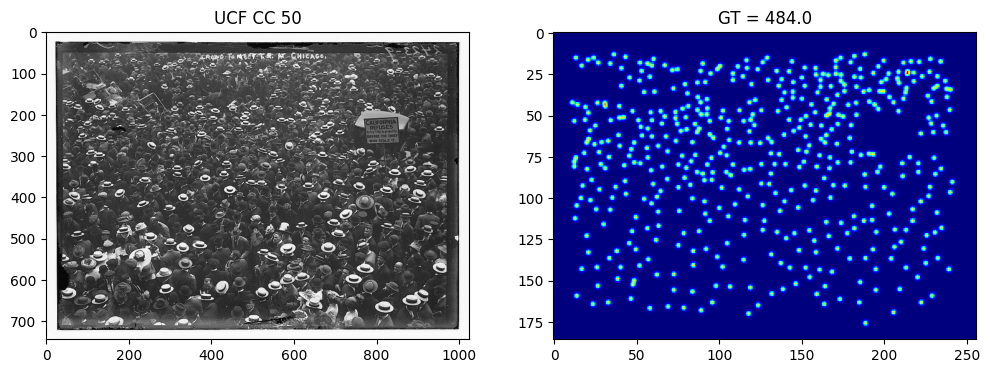

In [26]:
number = random.randint(0, 49)
gs = UCF_CC_50(UCF_CC_50_IMG, aug_val_test)
im, dm = gs[number]

f, axarr = plt.subplots(1, 2, figsize=(12, 12))
axarr[0].imshow(im, cmap='gray')
axarr[0].title.set_text('UCF CC 50')
axarr[1].imshow(dm, cmap='jet')
axarr[1].title.set_text('GT = '+str(dm.sum()))

In [27]:
# Define a function to divide a dataset of images and their corresponding ground truth (GT) into smaller slices
def divide_img(dataset):
    # Initialize empty lists to hold image slices and corresponding ground truth slices
    img = []
    gt = []

    # Loop through each item in the dataset
    # The dataset is assumed to contain pairs of (image, density map)
    for i in range(len(dataset)):
        # Extract the image and corresponding density map (GT)
        im, dm = dataset[i]
        
        # Get the dimensions of the image (height and width)
        height = im.shape[0]
        width = im.shape[1]
        
        # Get the dimensions of the density map (GT)
        height_2 = dm.shape[0]
        width_2 = dm.shape[1]
        
        # Define slices to divide the image into four quadrants (top-left, top-right, bottom-left, bottom-right)
        slices_im = [
            (slice(0, height // 2), slice(0, width // 2)),          # Top-left quadrant
            (slice(0, height // 2), slice(width // 2, width)),      # Top-right quadrant
            (slice(height // 2, height), slice(0, width // 2)),     # Bottom-left quadrant
            (slice(height // 2, height), slice(width // 2, width))  # Bottom-right quadrant
        ]
        
        # Define slices to divide the density map (GT) into four quadrants (top-left, top-right, bottom-left, bottom-right)
        slices_dm = [
            (slice(0, height_2 // 2), slice(0, width_2 // 2)),              # Top-left quadrant
            (slice(0, height_2 // 2), slice(width_2 // 2, width_2)),        # Top-right quadrant
            (slice(height_2 // 2, height_2), slice(0, width_2 // 2)),       # Bottom-left quadrant
            (slice(height_2 // 2, height_2), slice(width_2 // 2, width_2))  # Bottom-right quadrant
        ]
        
        # Loop through each slice in the image (slices_im)
        # For each slice, extract the corresponding piece of the image and append to the 'img' list
        for j, (row_slice, col_slice) in enumerate(slices_im):
            piece = im[row_slice, col_slice]  # Extract the image slice using the defined row and column slices
            img.append(piece)  # Append the slice to the image list
            
        # Loop through each slice in the density map (slices_dm)
        # For each slice, extract the corresponding piece of the density map (GT) and append to the 'gt' list
        for j, (row_slice, col_slice) in enumerate(slices_dm):
            piece = dm[row_slice, col_slice]  # Extract the density map slice using the defined row and column slices
            gt.append(piece)  # Append the slice to the ground truth list
            
    # Return the lists containing the image slices and corresponding ground truth slices
    return img, gt


In [28]:
IMG_part_A = []
GT_part_A = []
ds = DatasetA(train_A, aug_train)

IMG_part_A, GT_part_A = divide_img(ds)

In [29]:
len(IMG_part_A), len(GT_part_A)

(1200, 1200)

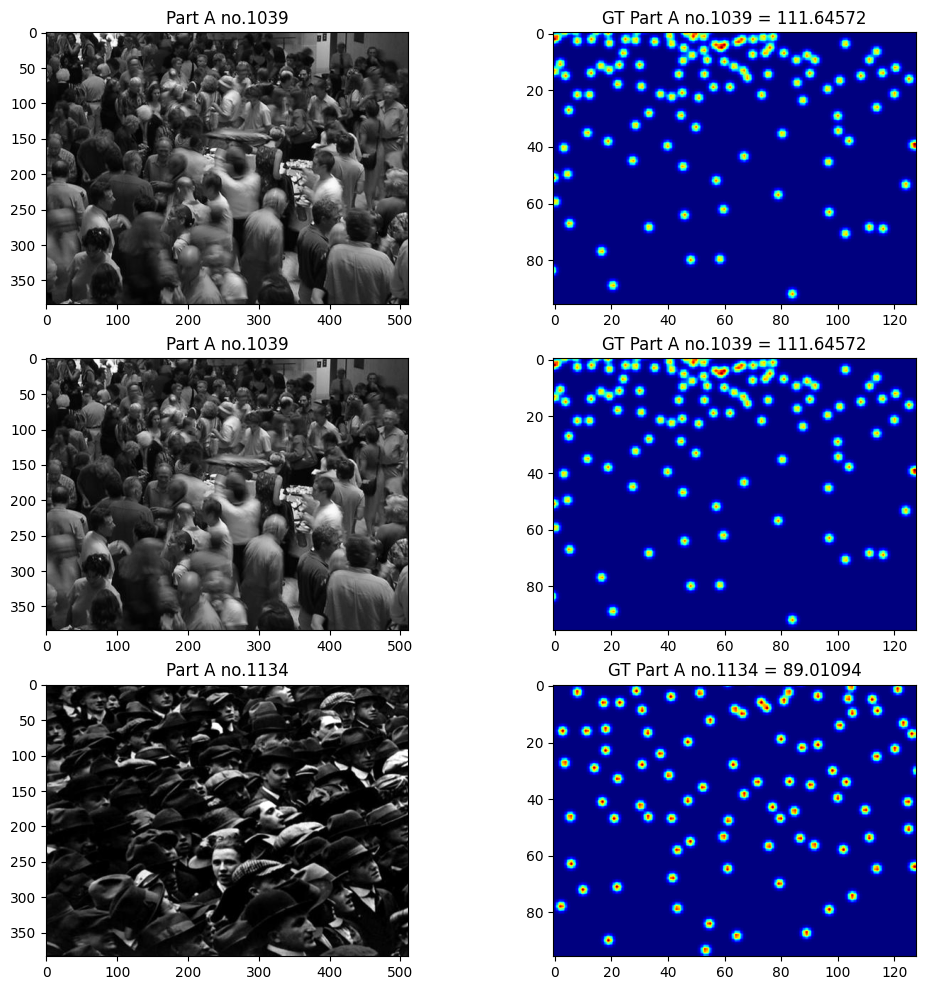

In [30]:
number1 = random.randint(0, 1199)
number2 = random.randint(0, 1199)
number3 = random.randint(0, 1199)

f, axarr = plt.subplots(3, 2, figsize=(12, 12))
axarr[0,0].imshow(IMG_part_A[number1], cmap='gray')
axarr[0,1].imshow(GT_part_A[number1], cmap='jet')
axarr[1,0].imshow(IMG_part_A[number2], cmap='gray')
axarr[1,1].imshow(GT_part_A[number2], cmap='jet')
axarr[2,0].imshow(IMG_part_A[number3], cmap='gray')
axarr[2,1].imshow(GT_part_A[number3], cmap='jet')
axarr[0,0].title.set_text('Part A no.'+str(number1))
axarr[0,1].title.set_text('GT Part A no.'+str(number1)+' = '+str(GT_part_A[number1].sum()))
axarr[1,0].title.set_text('Part A no.'+str(number2))
axarr[1,1].title.set_text('GT Part A no.'+str(number2)+' = '+str(GT_part_A[number2].sum()))
axarr[2,0].title.set_text('Part A no.'+str(number3))
axarr[2,1].title.set_text('GT Part A no.'+str(number3)+' = '+str(GT_part_A[number3].sum()))

f.savefig("output_plot_part_A.png", dpi=300, bbox_inches='tight')  # Save as PNG
plt.show()

In [31]:
IMG_part_B = []
GT_part_B = []
ds = DatasetB(train_B, aug_train)

IMG_part_B, GT_part_B = divide_img(ds)

In [32]:
len(IMG_part_B), len(GT_part_B)

(1600, 1600)

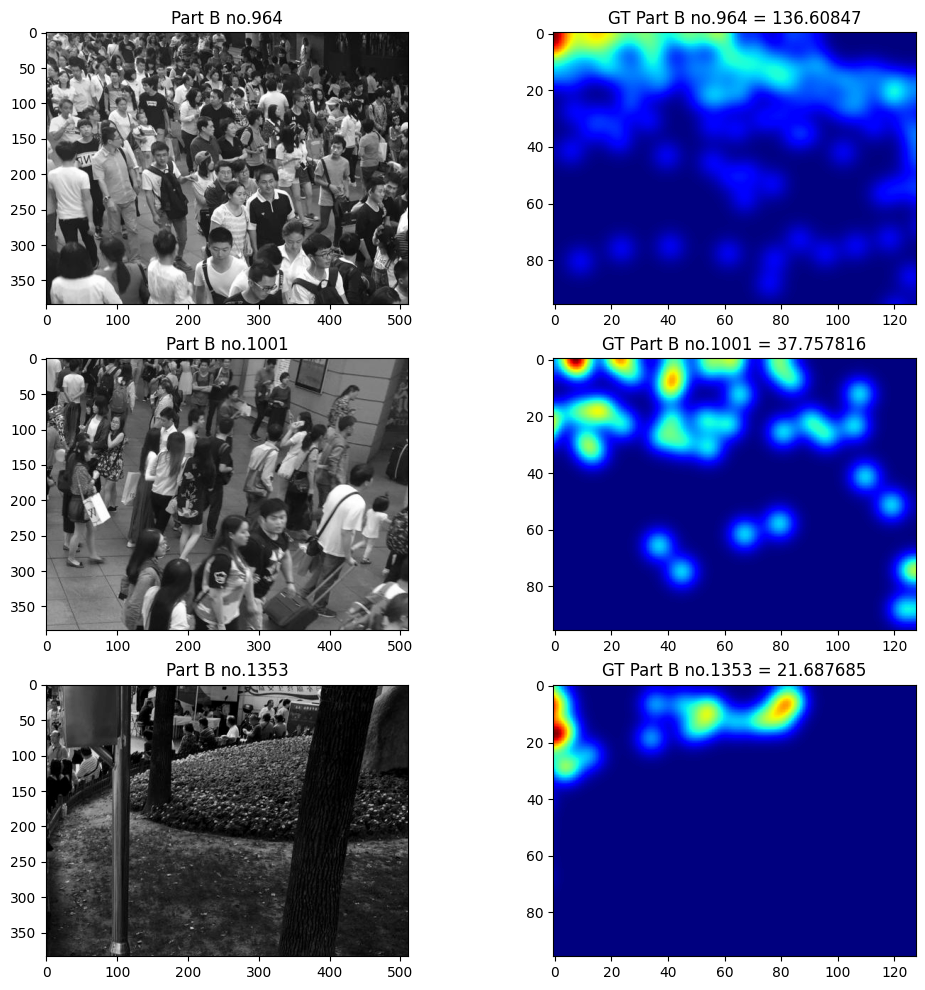

In [33]:
number1 = random.randint(0, 1599)
number2 = random.randint(0, 1599)
number3 = random.randint(0, 1599)

f, axarr = plt.subplots(3, 2, figsize=(12, 12))
axarr[0,0].imshow(IMG_part_B[number1], cmap='gray')
axarr[0,1].imshow(GT_part_B[number1], cmap='jet')
axarr[1,0].imshow(IMG_part_B[number2], cmap='gray')
axarr[1,1].imshow(GT_part_B[number2], cmap='jet')
axarr[2,0].imshow(IMG_part_B[number3], cmap='gray')
axarr[2,1].imshow(GT_part_B[number3], cmap='jet')
axarr[0,0].title.set_text('Part B no.'+str(number1))
axarr[0,1].title.set_text('GT Part B no.'+str(number1)+' = '+str(GT_part_B[number1].sum()))
axarr[1,0].title.set_text('Part B no.'+str(number2))
axarr[1,1].title.set_text('GT Part B no.'+str(number2)+' = '+str(GT_part_B[number2].sum()))
axarr[2,0].title.set_text('Part B no.'+str(number3))
axarr[2,1].title.set_text('GT Part B no.'+str(number3)+' = '+str(GT_part_B[number3].sum()))

f.savefig("output_plot_part_B.png", dpi=300, bbox_inches='tight')  # Save as PNG
plt.show()

In [34]:
IMG = []
IMG.extend(IMG_part_B)
IMG.extend(IMG_part_A)

GT = []
GT.extend(GT_part_B)
GT.extend(GT_part_A)

In [35]:
IMG_part_A = []
GT_part_A = []
IMG_part_B = []
GT_part_B = []

In [36]:
len(IMG), len(GT)

(2800, 2800)

In [37]:
# Initialize empty lists to store validation images and their corresponding ground truth
IMG_val = []
GT_val = []

qs = DatasetB(valid_B_split, aug_val)
ws = DatasetA(valid_A_split, aug_val)

# Iterate through DatasetB (qs)
for im, dm in qs:
    IMG_val.append(im)  # Append the image (im) to the list IMG_val
    GT_val.append(dm)   # Append the ground truth (dm) to the list GT_val

# Iterate through DatasetA (ws)
for im, dm in ws:
    IMG_val.append(im)  # Append the image (im) to the list IMG_val
    GT_val.append(dm)   # Append the ground truth (dm) to the list GT_val

# Check the lengths
len(IMG_val), len(GT_val)

(449, 449)

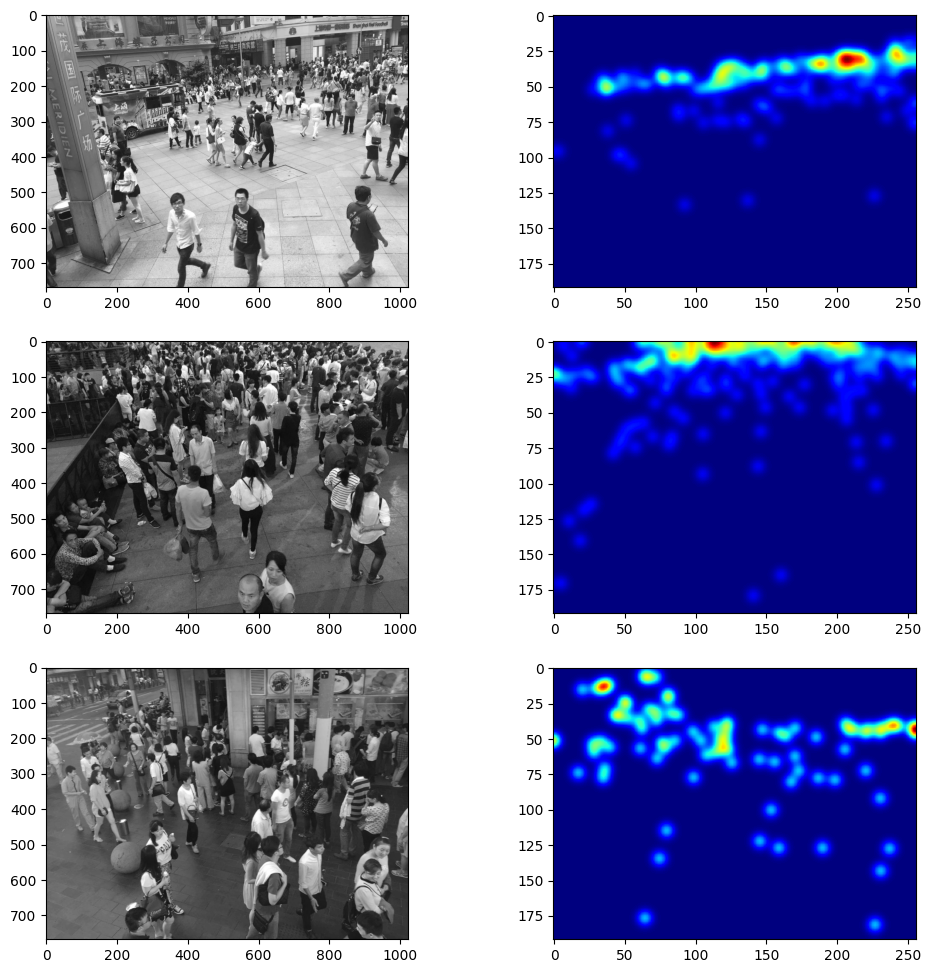

In [38]:
number1 = random.randint(0, 448)
number2 = random.randint(0, 448)
number3 = random.randint(0, 448)

f, axarr = plt.subplots(3, 2, figsize=(12, 12))
axarr[0,0].imshow(IMG_val[number1], cmap='gray')
axarr[0,1].imshow(GT_val[number1], cmap='jet')
axarr[1,0].imshow(IMG_val[number2], cmap='gray')
axarr[1,1].imshow(GT_val[number2], cmap='jet')
axarr[2,0].imshow(IMG_val[number3], cmap='gray')
axarr[2,1].imshow(GT_val[number3], cmap='jet')

In [39]:
# Create a TensorFlow dataset from the training images (IMG) and ground truth (GT)
train_loader = tf.data.Dataset.from_tensor_slices((IMG, GT))

# Shuffle the training dataset to randomize the order of the data
# The buffer size is set to the length of the dataset (IMG) to shuffle all elements
train_loader = train_loader.shuffle(buffer_size=len(IMG))

# Batch the training dataset into smaller batches of 32 samples each
train_loader = train_loader.batch(32)

# Prefetch the training data to optimize the input pipeline by loading data in the background
# AUTOTUNE allows TensorFlow to automatically tune the prefetching based on system performance
train_loader = train_loader.prefetch(tf.data.AUTOTUNE)


In [40]:
# Create a TensorFlow dataset from the validation images (IMG_val) and ground truth (GT_val)
val_loader = tf.data.Dataset.from_tensor_slices((IMG_val, GT_val))

# Batch the validation dataset into smaller batches of 32 samples each
val_loader = val_loader.batch(32)

# Prefetch the validation data to optimize the input pipeline by loading data in the background
val_loader = val_loader.prefetch(tf.data.AUTOTUNE)


In [41]:
len(train_loader), len(val_loader)

(88, 15)

In [42]:
from keras.layers import Conv2D, MaxPooling2D, Concatenate, Input
from keras.models import Model

def LargeBranch(input_shape=None):
    # Define the input layer with the specified shape (input_shape)
    input = Input(shape=input_shape)

    # Apply a 2D convolutional layer with 16 filters, 9x9 kernel size, and ReLU activation
    large = Conv2D(16, (9, 9), padding='same', activation='relu')(input)

    # Apply a max pooling layer with a pool size of 2x2
    large = MaxPooling2D(2)(large)

    # Apply another 2D convolutional layer with 32 filters, 7x7 kernel size, and ReLU activation
    large = Conv2D(32, (7, 7), padding='same', activation='relu')(large)

    # Apply another max pooling layer with a pool size of 2x2
    large = MaxPooling2D(2)(large)

    # Apply a 2D convolutional layer with 16 filters, 7x7 kernel size, and ReLU activation
    large = Conv2D(16, (7, 7), padding='same', activation='relu')(large)

    # Apply another 2D convolutional layer with 8 filters, 7x7 kernel size, and ReLU activation
    large = Conv2D(8, (7, 7), padding='same', activation='relu')(large)

    # Apply a final 2D convolutional layer with 1 filter and 1x1 kernel size (no activation function)
    large = Conv2D(1, (1, 1), padding='same')(large)

    # Define the model with the input layer and the output layer
    model = Model(inputs=input, outputs=large)
    
    return model


In [43]:
input_shape = (None, None, 1)
model = LargeBranch(input_shape)
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, None, None, 1)  │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, None, None, 16) │         1,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, None, None, 16) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, None, None, 32) │        25,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, None, None, 32) │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, None, None, 16) │        25,104 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, None, None, 8)  │         6,280 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, None, None, 1)  │             9 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 57,825 (225.88 KB)

 Trainable params: 57,825 (225.88 KB)

 Non-trainable params: 0 (0.00 B)

In [44]:
# Create an Adam optimizer with a specified learning rate of 3e-4
adam = Adam(learning_rate=3e-4)

# Compile the model using the Adam optimizer and mean squared error loss function
model.compile(loss='mean_squared_error', optimizer=adam)

In [45]:
# Custom callback for logging and saving models
class CSVAndModelSaverCallback(Callback):
    def __init__(self, csv_file, model_save_path, specific_epochs):
        super(CSVAndModelSaverCallback, self).__init__()
        self.csv_file = csv_file
        self.model_save_path = model_save_path
        self.specific_epochs = specific_epochs
        self.best_val_loss = float('inf')
        self.headers_written = False

    def on_epoch_end(self, epoch, logs=None):
        # Extract epoch, loss, and val_loss
        epoch_number = epoch + 1
        loss = logs.get('loss')
        val_loss = logs.get('val_loss')

        # Open CSV file and write data with commas as the delimiter
        with open(self.csv_file, mode='a', newline='') as file:
            writer = csv.writer(file, delimiter=',', quoting=csv.QUOTE_MINIMAL)
            if not self.headers_written:
                writer.writerow(['epoch', 'loss', 'val_loss'])  # Write header only once
                self.headers_written = True
            writer.writerow([epoch_number, loss, val_loss])  # Write data row

        # Save model at specified epochs
        if epoch_number in self.specific_epochs:
            filepath = f"{self.model_save_path}_epoch_{epoch_number}.keras"
            self.model.save(filepath)
            print(f"Model saved at epoch {epoch_number} to {filepath}")

        # Save the model with the lowest validation loss
        if val_loss is not None and val_loss < self.best_val_loss:
            self.best_val_loss = val_loss
            filepath = f"{self.model_save_path}_best_val_loss.keras"
            self.model.save(filepath)
            print(f"Model with lowest val_loss ({val_loss}) saved to {filepath}")

# Initialize the callback
csv_and_model_saver = CSVAndModelSaverCallback(
    csv_file='training_log.csv',
    model_save_path='/kaggle/working/largebranch',
    specific_epochs=[50, 150, 250]
)

In [46]:
# Train the model using the 'fit' method
Pre_Trained_SmallBranch_MCNN_h = model.fit(
    train_loader,  # The training dataset is provided as train_loader 
    
    # The validation dataset is provided as val_loader
    validation_data=val_loader,  
    
    # The model will train for 250 epochs.
    epochs=250,  
    
    # Specify callbacks to be executed during training, such as saving models and logging training progress
    callbacks=[csv_and_model_saver],  
    
    # Set the verbosity level to 1, which prints detailed logs during training
    verbose=1  
)

Epoch 1/250


I0000 00:00:1732930992.995096      81 service.cc:145] XLA service 0x79e57000b200 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732930992.995185      81 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
2024-11-30 01:43:20.716835: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[32,16,7,7]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,16,192,256]{3,2,1,0}, f32[32,32,192,256]{3,2,1,0}), window={size=7x7 pad=3_3x3_3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-11-30 01:43:21.233187: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.516463921s
Trying algorithm eng0{} for conv

 2/88 ━━━━━━━━━━━━━━━━━━━━ 7s 89ms/step - loss: 0.0018  

I0000 00:00:1732931003.474607      81 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


88/88 ━━━━━━━━━━━━━━━━━━━━ 0s 145ms/step - loss: 7.3976e-04Model with lowest val_loss (0.00042881854460574687) saved to /kaggle/working/largebranch_best_val_loss.keras
88/88 ━━━━━━━━━━━━━━━━━━━━ 37s 270ms/step - loss: 7.3900e-04 - val_loss: 4.2882e-04
Epoch 2/250
87/88 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 6.2822e-04Model with lowest val_loss (0.00042721963836811483) saved to /kaggle/working/largebranch_best_val_loss.keras
88/88 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 6.2827e-04 - val_loss: 4.2722e-04
Epoch 3/250
87/88 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 6.0907e-04Model with lowest val_loss (0.0003934607084374875) saved to /kaggle/working/largebranch_best_val_loss.keras
88/88 ━━━━━━━━━━━━━━━━━━━━ 9s 104ms/step - loss: 6.0890e-04 - val_loss: 3.9346e-04
Epoch 4/250
87/88 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 5.7997e-04Model with lowest val_loss (0.000393266964238137) saved to /kaggle/working/largebranch_best_val_loss.keras
88/88 ━━━━━━━━━━━━━━━━━━━━ 9s 105ms/step - loss:

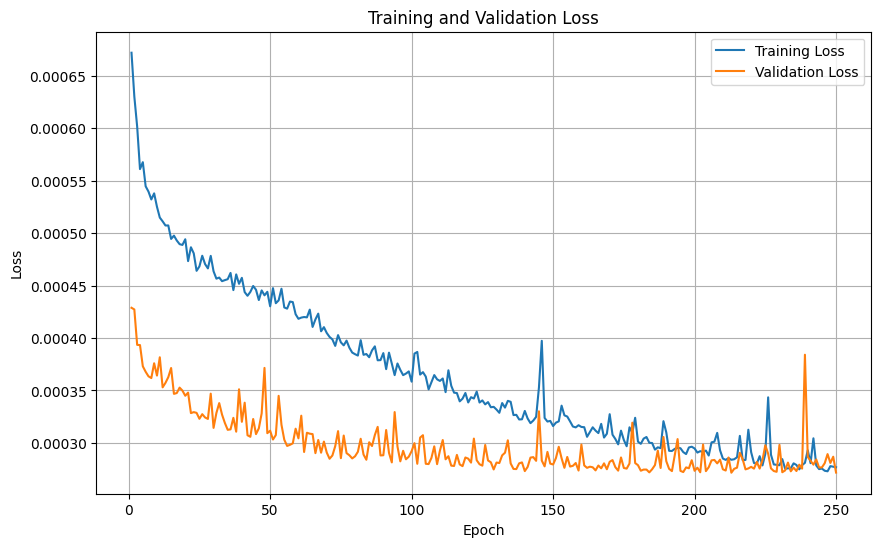

In [4]:
# Step 1: Load the CSV file
csv_file = '/kaggle/input/output-largebranch/training_log.csv'  # Path to your CSV file
data = pd.read_csv(csv_file)

# Step 2: Extract columns
epochs = data['epoch']
loss = data['loss']
val_loss = data['val_loss']

# Step 3: Plot the data
plt.figure(figsize=(10, 6))
plt.plot(epochs, loss, label='Training Loss')
plt.plot(epochs, val_loss, label='Validation Loss')

# Step 4: Add labels, title, legend
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)

# Step 5: Show the plot
plt.savefig("output_training_largebranch.png", dpi=300, bbox_inches='tight')  # Save as PNG
plt.show()


In [5]:
# Step 2: Cari nilai terkecil dan epoch untuk loss
min_loss = data['loss'].min()
min_loss_epoch = data[data['loss'] == min_loss]['epoch'].values[0]

# Step 3: Cari nilai terkecil dan epoch untuk val_loss
min_val_loss = data['val_loss'].min()
min_val_loss_epoch = data[data['val_loss'] == min_val_loss]['epoch'].values[0]

# Step 4: Cetak hasil
print(f"Epoch dengan nilai loss terkecil: {min_loss_epoch}, nilai loss: {min_loss}")
print(f"Epoch dengan nilai val_loss terkecil: {min_val_loss_epoch}, nilai val_loss: {min_val_loss}")

Epoch dengan nilai loss terkecil: 247, nilai loss: 0.000272917037364
Epoch dengan nilai val_loss terkecil: 213, nilai val_loss: 0.0002715529408305


In [7]:
# Load the trained models from saved files at different epochs or based on the best validation loss
model_50_epoch = load_model('/kaggle/input/output-largebranch/largebranch_epoch_50.keras')
model_150_epoch = load_model('/kaggle/input/output-largebranch/largebranch_epoch_150.keras')
model_250_epoch = load_model('/kaggle/input/output-largebranch/largebranch_epoch_250.keras')
model_best_val_loss = load_model('/kaggle/input/output-largebranch/largebranch_best_val_loss.keras')

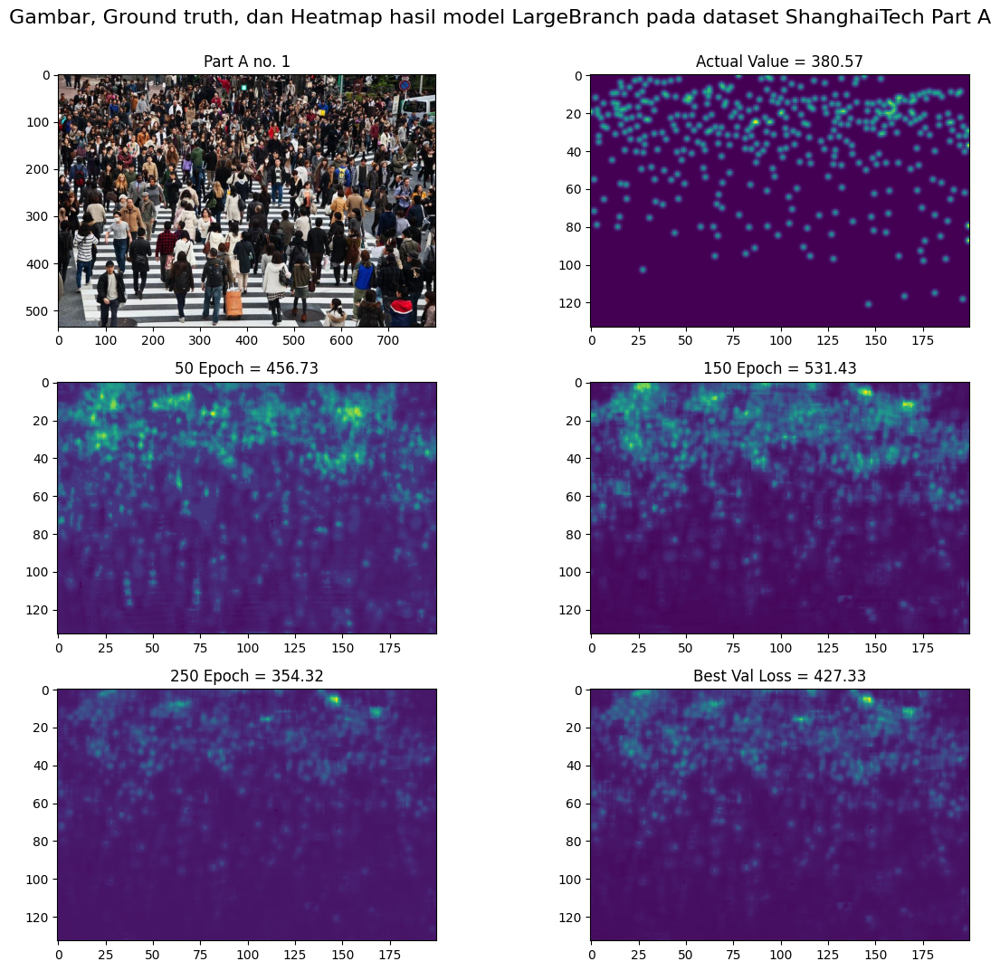

In [8]:
number = random.randint(0, 17)

ds = DatasetA(test_A_split, aug_val_test)

im, dm = ds[0]
test_50_epoch = tf.identity(model_50_epoch(tf.expand_dims(im, axis=0)))[0]
test_150_epoch = tf.identity(model_150_epoch(tf.expand_dims(im, axis=0)))[0]
test_250_epoch = tf.identity(model_250_epoch(tf.expand_dims(im, axis=0)))[0]
test_best_val_loss = tf.identity(model_best_val_loss(tf.expand_dims(im, axis=0)))[0]

img = cv2.imread(test_A_split[0], cv2.IMREAD_COLOR)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

f, axarr = plt.subplots(3, 2, figsize=(12, 12))

axarr[0,0].imshow(img)
axarr[0,1].imshow(dm)
axarr[1,0].imshow(test_50_epoch)
axarr[1,1].imshow(test_150_epoch)
axarr[2,0].imshow(test_250_epoch,)
axarr[2,1].imshow(test_best_val_loss)

plt.suptitle("Gambar, Ground truth, dan Heatmap hasil model LargeBranch pada dataset ShanghaiTech Part A", fontsize=16, y=0.92)

axarr[0,0].title.set_text('Part A no. ' + str(0+1))
axarr[0,1].title.set_text('Actual Value = ' + str(round(dm.sum(), 2)))
axarr[1,0].title.set_text('50 Epoch = ' + str(round(np.sum(test_50_epoch), 2)))
axarr[1,1].title.set_text('150 Epoch = ' + str(round(np.sum(test_150_epoch), 2)))
axarr[2,0].title.set_text('250 Epoch = ' + str(round(np.sum(test_250_epoch), 2)))
axarr[2,1].title.set_text('Best Val Loss = ' + str(round(np.sum(test_best_val_loss), 2)))

# Simpan ke file
plt.tight_layout(rect=[0, 0.03, 1, 0.92])
plt.savefig("visualisasi_heatmap_partA_largebranch.png", bbox_inches='tight', dpi=300)

# Kalau di lingkungan seperti Kaggle:
import shutil
shutil.move("visualisasi_heatmap_partA_largebranch.png", "/kaggle/working/visualisasi_heatmap_partA_largebranch.png")

# Tampilkan gambar
plt.show()

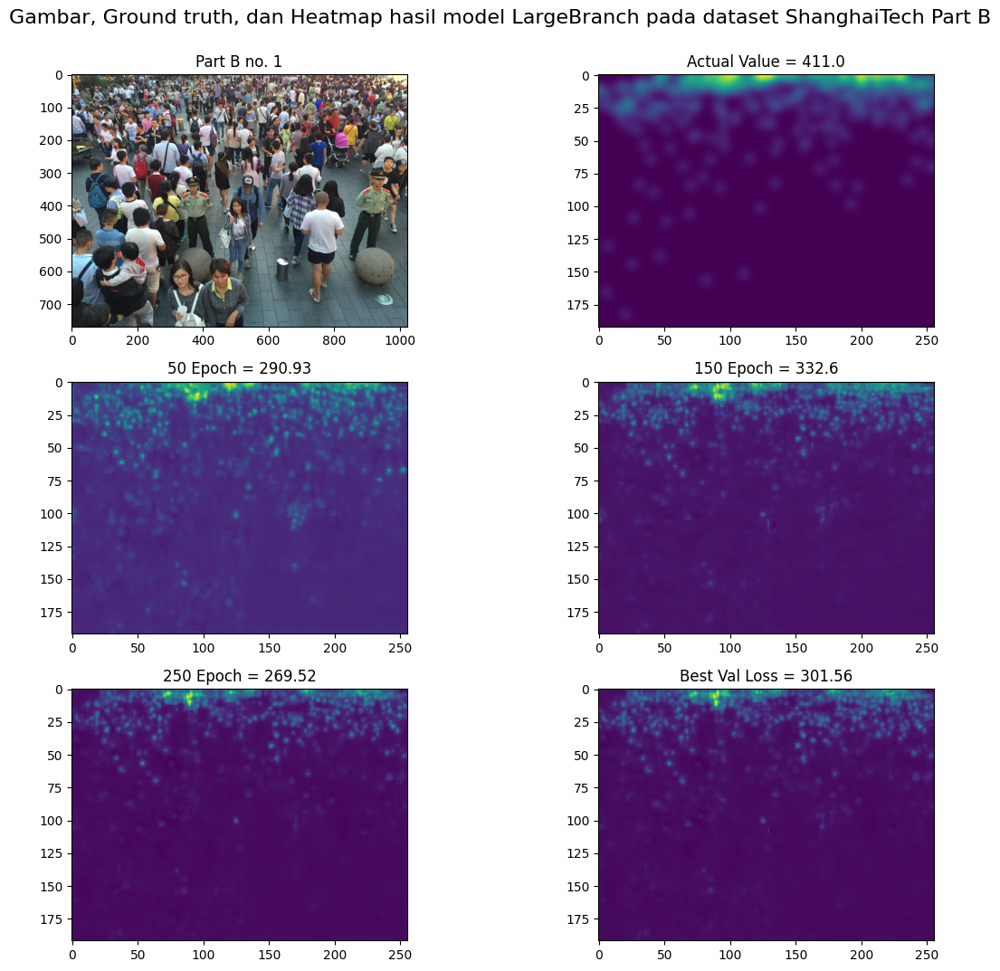

In [9]:
ds = DatasetB(test_B_split, aug_val_test)

im, dm = ds[0]
test_50_epoch = tf.identity(model_50_epoch(tf.expand_dims(im, axis=0)))[0]
test_150_epoch = tf.identity(model_150_epoch(tf.expand_dims(im, axis=0)))[0]
test_250_epoch = tf.identity(model_250_epoch(tf.expand_dims(im, axis=0)))[0]
test_best_val_loss = tf.identity(model_best_val_loss(tf.expand_dims(im, axis=0)))[0]

img = cv2.imread(test_B_split[0], cv2.IMREAD_COLOR)
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

f, axarr = plt.subplots(3, 2, figsize=(12, 12))

axarr[0,0].imshow(img)
axarr[0,1].imshow(dm)
axarr[1,0].imshow(test_50_epoch)
axarr[1,1].imshow(test_150_epoch)
axarr[2,0].imshow(test_250_epoch,)
axarr[2,1].imshow(test_best_val_loss)

plt.suptitle("Gambar, Ground truth, dan Heatmap hasil model LargeBranch pada dataset ShanghaiTech Part B", fontsize=16, y=0.92)

axarr[0,0].title.set_text('Part B no. ' + str(0+1))
axarr[0,1].title.set_text('Actual Value = ' + str(round(dm.sum(), 2)))
axarr[1,0].title.set_text('50 Epoch = ' + str(round(np.sum(test_50_epoch), 2)))
axarr[1,1].title.set_text('150 Epoch = ' + str(round(np.sum(test_150_epoch), 2)))
axarr[2,0].title.set_text('250 Epoch = ' + str(round(np.sum(test_250_epoch), 2)))
axarr[2,1].title.set_text('Best Val Loss = ' + str(round(np.sum(test_best_val_loss), 2)))

# Simpan ke file
plt.tight_layout(rect=[0, 0.03, 1, 0.92])
plt.savefig("visualisasi_heatmap_partB_largebranch.png", bbox_inches='tight', dpi=300)

# Kalau di lingkungan seperti Kaggle:
import shutil
shutil.move("visualisasi_heatmap_partB_largebranch.png", "/kaggle/working/visualisasi_heatmap_partB_largebranch.png")

# Tampilkan gambar
plt.show()

In [8]:
import os
import zipfile
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from IPython.display import FileLink
import shutil

# Folder penyimpanan gambar
output_folder = "heatmap_images_part_A"
os.makedirs(output_folder, exist_ok=True)

# Loop untuk menyimpan 18 gambar (0 sampai 17)
for number in range(18):
    ds = DatasetA(test_A_split, aug_val_test)
    img = cv2.imread(test_A_split[number], cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    im, dm = ds[number]
    
    test_50_epoch = tf.identity(model_50_epoch(tf.expand_dims(im, axis=0)))[0]
    test_150_epoch = tf.identity(model_150_epoch(tf.expand_dims(im, axis=0)))[0]
    test_250_epoch = tf.identity(model_250_epoch(tf.expand_dims(im, axis=0)))[0]
    test_best_val_loss = tf.identity(model_best_val_loss(tf.expand_dims(im, axis=0)))[0]

    # Buat plot 3x2
    f, axarr = plt.subplots(3, 2, figsize=(12, 12))
    axarr[0, 0].imshow(img)
    axarr[0, 1].imshow(dm)
    axarr[1, 0].imshow(test_50_epoch)
    axarr[1, 1].imshow(test_150_epoch)
    axarr[2, 0].imshow(test_250_epoch)
    axarr[2, 1].imshow(test_best_val_loss)

    # Tambahkan judul pada subplot
    axarr[0, 0].title.set_text(f'Part A no. {number+1}')
    axarr[0, 1].title.set_text(f'Actual Value = {round(dm.sum())}')
    axarr[1, 0].title.set_text(f'50 Epoch = {round(np.sum(test_50_epoch))}')
    axarr[1, 1].title.set_text(f'150 Epoch = {round(np.sum(test_150_epoch))}')
    axarr[2, 0].title.set_text(f'250 Epoch = {round(np.sum(test_250_epoch))}')
    axarr[2, 1].title.set_text(f'Best Val Loss = {round(np.sum(test_best_val_loss))}')

    # Simpan gambar ke dalam folder
    img_path = os.path.join(output_folder, f"partA_{number+1}.png")
    plt.savefig(img_path)
    plt.close()

    print(f"Gambar {img_path} telah disimpan.")

# Buat file ZIP di dalam output_folder
zip_filename = "largebranch_heatmap_results_part_A.zip"
zip_path = os.path.join(output_folder, zip_filename)

with zipfile.ZipFile(zip_path, 'w') as zipf:
    for file in os.listdir(output_folder):
        if file.endswith(".png"):
            zipf.write(os.path.join(output_folder, file), file)

print(f"Semua gambar telah dikompresi ke dalam {zip_path}.")

# Pindahkan ZIP ke direktori utama
shutil.move(zip_path, zip_filename)

# Generate link untuk mengunduh
FileLink(zip_filename)


Gambar heatmap_images_part_A/partA_1.png telah disimpan.
Gambar heatmap_images_part_A/partA_2.png telah disimpan.
Gambar heatmap_images_part_A/partA_3.png telah disimpan.
Gambar heatmap_images_part_A/partA_4.png telah disimpan.
Gambar heatmap_images_part_A/partA_5.png telah disimpan.
Gambar heatmap_images_part_A/partA_6.png telah disimpan.
Gambar heatmap_images_part_A/partA_7.png telah disimpan.
Gambar heatmap_images_part_A/partA_8.png telah disimpan.
Gambar heatmap_images_part_A/partA_9.png telah disimpan.
Gambar heatmap_images_part_A/partA_10.png telah disimpan.
Gambar heatmap_images_part_A/partA_11.png telah disimpan.
Gambar heatmap_images_part_A/partA_12.png telah disimpan.
Gambar heatmap_images_part_A/partA_13.png telah disimpan.
Gambar heatmap_images_part_A/partA_14.png telah disimpan.
Gambar heatmap_images_part_A/partA_15.png telah disimpan.
Gambar heatmap_images_part_A/partA_16.png telah disimpan.
Gambar heatmap_images_part_A/partA_17.png telah disimpan.
Gambar heatmap_images_p

/kaggle/working/largebranch_heatmap_results_part_A.zip

In [9]:
import os
import zipfile
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import cv2
from IPython.display import FileLink
import shutil

# Folder penyimpanan gambar
output_folder = "heatmap_images_part_B"
os.makedirs(output_folder, exist_ok=True)

# Loop untuk menyimpan 31 gambar (0 sampai 30)
for number in range(31):
    ds = DatasetB(test_B_split, aug_val_test)
    img = cv2.imread(test_B_split[number], cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    im, dm = ds[number]
    
    test_50_epoch = tf.identity(model_50_epoch(tf.expand_dims(im, axis=0)))[0]
    test_150_epoch = tf.identity(model_150_epoch(tf.expand_dims(im, axis=0)))[0]
    test_250_epoch = tf.identity(model_250_epoch(tf.expand_dims(im, axis=0)))[0]
    test_best_val_loss = tf.identity(model_best_val_loss(tf.expand_dims(im, axis=0)))[0]

    # Buat plot 3x2
    f, axarr = plt.subplots(3, 2, figsize=(12, 12))
    axarr[0, 0].imshow(img)
    axarr[0, 1].imshow(dm)
    axarr[1, 0].imshow(test_50_epoch)
    axarr[1, 1].imshow(test_150_epoch)
    axarr[2, 0].imshow(test_250_epoch)
    axarr[2, 1].imshow(test_best_val_loss)

    # Tambahkan judul pada subplot
    axarr[0, 0].title.set_text(f'Part B no. {number+1}')
    axarr[0, 1].title.set_text(f'Actual Value = {round(dm.sum())}')
    axarr[1, 0].title.set_text(f'50 Epoch = {round(np.sum(test_50_epoch))}')
    axarr[1, 1].title.set_text(f'150 Epoch = {round(np.sum(test_150_epoch))}')
    axarr[2, 0].title.set_text(f'250 Epoch = {round(np.sum(test_250_epoch))}')
    axarr[2, 1].title.set_text(f'Best Val Loss = {round(np.sum(test_best_val_loss))}')

    # Simpan gambar ke dalam folder
    img_path = os.path.join(output_folder, f"partB_{number+1}.png")
    plt.savefig(img_path)
    plt.close()

    print(f"Gambar {img_path} telah disimpan.")

# Buat file ZIP di dalam output_folder
zip_filename = "largebranch_heatmap_results_part_B.zip"
zip_path = os.path.join(output_folder, zip_filename)

with zipfile.ZipFile(zip_path, 'w') as zipf:
    for file in os.listdir(output_folder):
        if file.endswith(".png"):
            zipf.write(os.path.join(output_folder, file), file)

print(f"Semua gambar telah dikompresi ke dalam {zip_path}.")

# Pindahkan ZIP ke direktori utama
shutil.move(zip_path, zip_filename)

# Generate link untuk mengunduh
FileLink(zip_filename)


Gambar heatmap_images_part_B/partB_1.png telah disimpan.
Gambar heatmap_images_part_B/partB_2.png telah disimpan.
Gambar heatmap_images_part_B/partB_3.png telah disimpan.
Gambar heatmap_images_part_B/partB_4.png telah disimpan.
Gambar heatmap_images_part_B/partB_5.png telah disimpan.
Gambar heatmap_images_part_B/partB_6.png telah disimpan.
Gambar heatmap_images_part_B/partB_7.png telah disimpan.
Gambar heatmap_images_part_B/partB_8.png telah disimpan.
Gambar heatmap_images_part_B/partB_9.png telah disimpan.
Gambar heatmap_images_part_B/partB_10.png telah disimpan.
Gambar heatmap_images_part_B/partB_11.png telah disimpan.
Gambar heatmap_images_part_B/partB_12.png telah disimpan.
Gambar heatmap_images_part_B/partB_13.png telah disimpan.
Gambar heatmap_images_part_B/partB_14.png telah disimpan.
Gambar heatmap_images_part_B/partB_15.png telah disimpan.
Gambar heatmap_images_part_B/partB_16.png telah disimpan.
Gambar heatmap_images_part_B/partB_17.png telah disimpan.
Gambar heatmap_images_p

/kaggle/working/largebranch_heatmap_results_part_B.zip

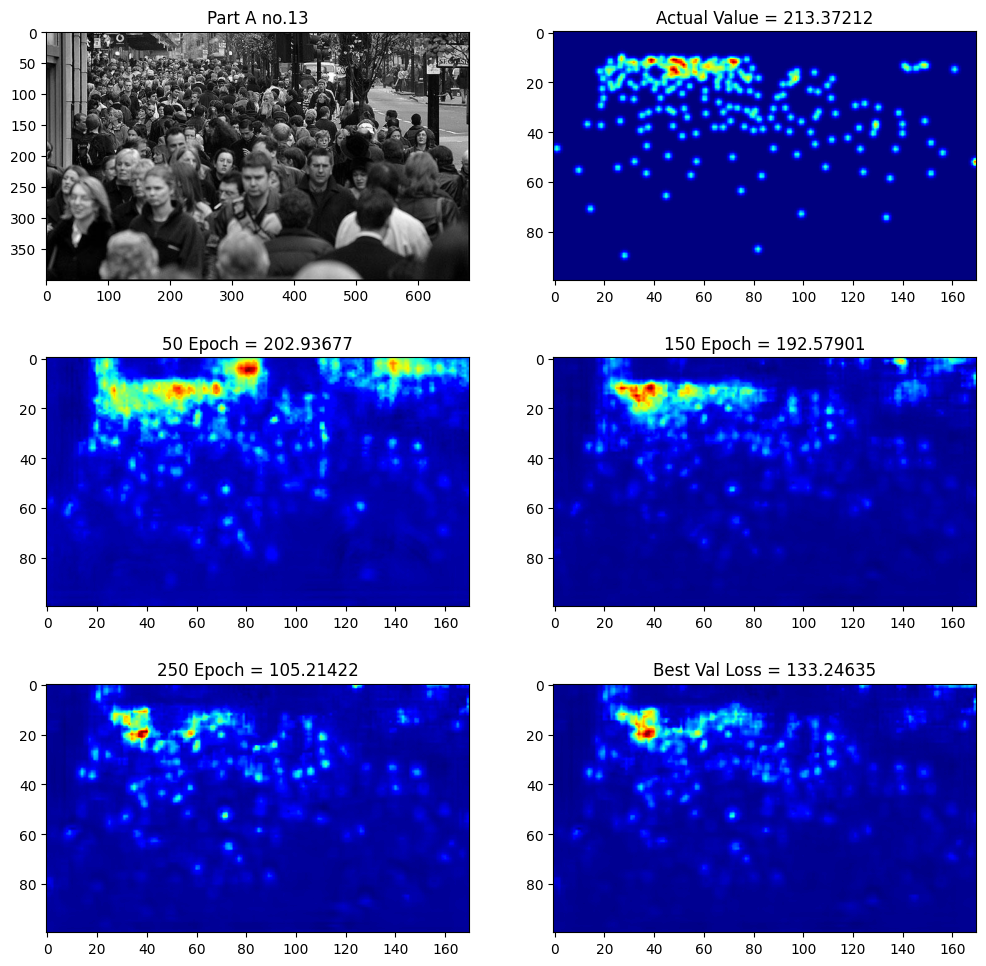

In [49]:
number = random.randint(0, 17)

ds = DatasetA(test_A_split, aug_val_test)

im, dm = ds[number]
test_50_epoch = tf.identity(model_50_epoch(tf.expand_dims(im, axis=0)))[0]
test_150_epoch = tf.identity(model_150_epoch(tf.expand_dims(im, axis=0)))[0]
test_250_epoch = tf.identity(model_250_epoch(tf.expand_dims(im, axis=0)))[0]
test_best_val_loss = tf.identity(model_best_val_loss(tf.expand_dims(im, axis=0)))[0]



f, axarr = plt.subplots(3, 2, figsize=(12, 12))
axarr[0,0].imshow(im, cmap='gray')
axarr[0,1].imshow(dm, cmap='jet')
axarr[1,0].imshow(test_50_epoch, cmap='jet')
axarr[1,1].imshow(test_150_epoch, cmap='jet')
axarr[2,0].imshow(test_250_epoch, cmap='jet')
axarr[2,1].imshow(test_best_val_loss, cmap='jet')
axarr[0,0].title.set_text('Part A no.'+str(number))
axarr[0,1].title.set_text('Actual Value = '+str(dm.sum()))
axarr[1,0].title.set_text('50 Epoch = '+str(np.sum(test_50_epoch)))
axarr[1,1].title.set_text('150 Epoch = '+str(np.sum(test_150_epoch)))
axarr[2,0].title.set_text('250 Epoch = '+str(np.sum(test_250_epoch)))
axarr[2,1].title.set_text('Best Val Loss = '+str(np.sum(test_best_val_loss)))


In [50]:
epoch_50 = []
epoch_150 = []
epoch_250 = []
best_val_loss = []

gtval = []

ds = DatasetA(test_A_split, aug_val_test)

for im, dm in ds:
    # Predict and sum values
    predval_50 = model_50_epoch(tf.expand_dims(im, axis=0))[0]
    predval_150 = model_150_epoch(tf.expand_dims(im, axis=0))[0]
    predval_250 = model_250_epoch(tf.expand_dims(im, axis=0))[0]
    predval_best_val_loss = model_best_val_loss(tf.expand_dims(im, axis=0))[0]
    epoch_50.append(tf.reduce_sum(predval_50).numpy())
    epoch_150.append(tf.reduce_sum(predval_150).numpy())
    epoch_250.append(tf.reduce_sum(predval_250).numpy())
    best_val_loss.append(tf.reduce_sum(predval_best_val_loss).numpy())
    gtval.append(tf.reduce_sum(dm).numpy())

# Calculate MAE
mae_50 = np.abs(np.subtract(gtval, epoch_50)).mean()
mae_150 = np.abs(np.subtract(gtval, epoch_150)).mean()
mae_250 = np.abs(np.subtract(gtval, epoch_250)).mean()
mae_best_val_loss = np.abs(np.subtract(gtval, best_val_loss)).mean()

# Calculate RMSE
rmse_50 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_50))))
rmse_150 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_150))))
rmse_250 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_250))))
rmse_best_val_loss = np.sqrt(np.mean(np.square(np.subtract(gtval, best_val_loss))))

# Print results with proper formatting
print(f"PART A MAE 50 EPOCH: {mae_50:.5f}")
print(f"PART A MAE 150 EPOCH: {mae_150:.5f}")
print(f"PART A MAE 250 EPOCH: {mae_250:.5f}")
print(f"PART A MAE BEST VAL LOSS: {mae_best_val_loss:.5f}\n")

print(f"PART A RMSE 50 EPOCH: {rmse_50:.5f}")
print(f"PART A RMSE 150 EPOCH: {rmse_150:.5f}")
print(f"PART A RMSE 250 EPOCH: {rmse_250:.5f}")
print(f"PART A RMSE BEST VAL LOSS: {rmse_best_val_loss:.5f}")


PART A MAE 50 EPOCH: 117.94938
PART A MAE 150 EPOCH: 134.46194
PART A MAE 250 EPOCH: 97.39372
PART A MAE BEST VAL LOSS: 113.23329

PART A RMSE 50 EPOCH: 152.73871
PART A RMSE 150 EPOCH: 170.97350
PART A RMSE 250 EPOCH: 148.42314
PART A RMSE BEST VAL LOSS: 154.49344


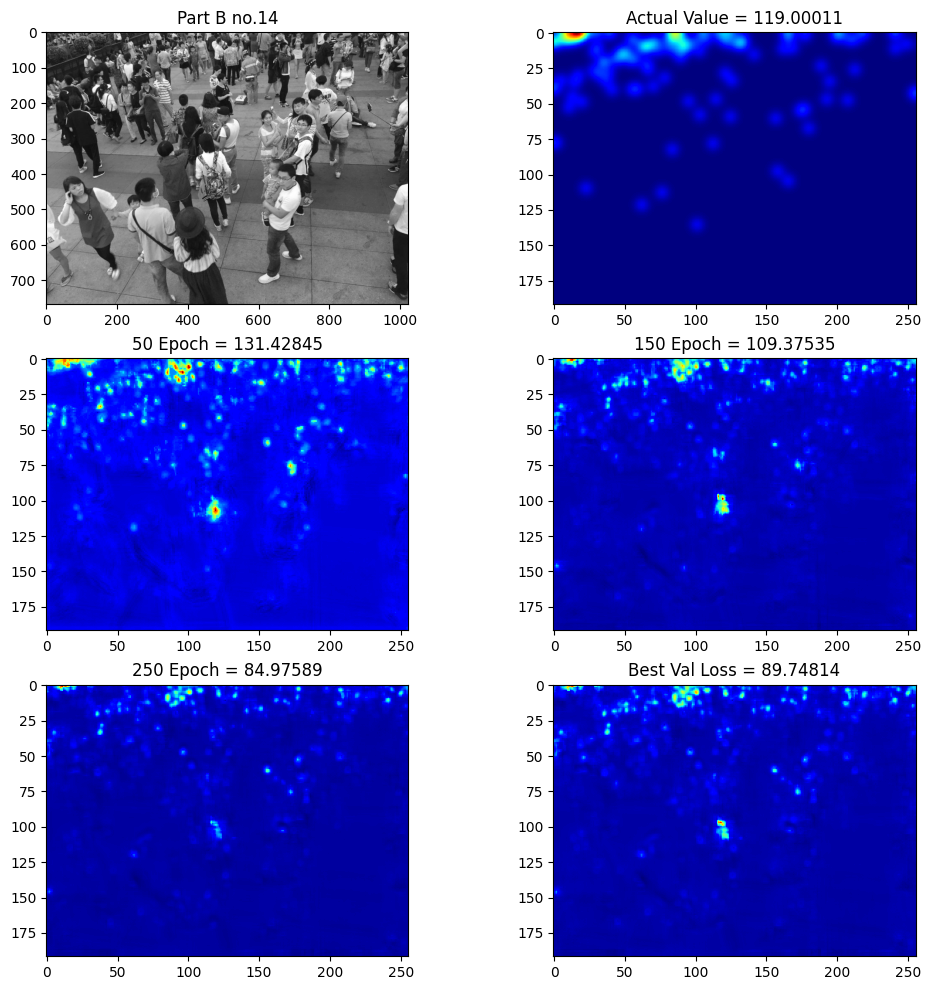

In [51]:
number = random.randint(0, 30)

ds = DatasetB(test_B_split, aug_val_test)

im, dm = ds[number]
test_50_epoch = tf.identity(model_50_epoch(tf.expand_dims(im, axis=0)))[0]
test_150_epoch = tf.identity(model_150_epoch(tf.expand_dims(im, axis=0)))[0]
test_250_epoch = tf.identity(model_250_epoch(tf.expand_dims(im, axis=0)))[0]
test_best_val_loss = tf.identity(model_best_val_loss(tf.expand_dims(im, axis=0)))[0]



f, axarr = plt.subplots(3, 2, figsize=(12, 12))
axarr[0,0].imshow(im, cmap='gray')
axarr[0,1].imshow(dm, cmap='jet')
axarr[1,0].imshow(test_50_epoch, cmap='jet')
axarr[1,1].imshow(test_150_epoch, cmap='jet')
axarr[2,0].imshow(test_250_epoch, cmap='jet')
axarr[2,1].imshow(test_best_val_loss, cmap='jet')
axarr[0,0].title.set_text('Part B no.'+str(number))
axarr[0,1].title.set_text('Actual Value = '+str(np.sum(dm)))
axarr[1,0].title.set_text('50 Epoch = '+str(np.sum(test_50_epoch)))
axarr[1,1].title.set_text('150 Epoch = '+str(np.sum(test_150_epoch)))
axarr[2,0].title.set_text('250 Epoch = '+str(np.sum(test_250_epoch)))
axarr[2,1].title.set_text('Best Val Loss = '+str(np.sum(test_best_val_loss)))


In [52]:
epoch_50 = []
epoch_150 = []
epoch_250 = []
best_val_loss = []

gtval = []

ds = DatasetB(test_B_split, aug_val_test)

for im, dm in ds:
    # Predict and sum values
    predval_50 = model_50_epoch(tf.expand_dims(im, axis=0))[0]
    predval_150 = model_150_epoch(tf.expand_dims(im, axis=0))[0]
    predval_250 = model_250_epoch(tf.expand_dims(im, axis=0))[0]
    predval_best_val_loss = model_best_val_loss(tf.expand_dims(im, axis=0))[0]
    epoch_50.append(tf.reduce_sum(predval_50).numpy())
    epoch_150.append(tf.reduce_sum(predval_150).numpy())
    epoch_250.append(tf.reduce_sum(predval_250).numpy())
    best_val_loss.append(tf.reduce_sum(predval_best_val_loss).numpy())
    gtval.append(tf.reduce_sum(dm).numpy())

# Calculate MAE
mae_50 = np.abs(np.subtract(gtval, epoch_50)).mean()
mae_150 = np.abs(np.subtract(gtval, epoch_150)).mean()
mae_250 = np.abs(np.subtract(gtval, epoch_250)).mean()
mae_best_val_loss = np.abs(np.subtract(gtval, best_val_loss)).mean()

# Calculate RMSE
rmse_50 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_50))))
rmse_150 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_150))))
rmse_250 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_250))))
rmse_best_val_loss = np.sqrt(np.mean(np.square(np.subtract(gtval, best_val_loss))))

# Print results with proper formatting
print(f"PART B MAE 50 EPOCH: {mae_50:.5f}")
print(f"PART B MAE 150 EPOCH: {mae_150:.5f}")
print(f"PART B MAE 250 EPOCH: {mae_250:.5f}")
print(f"PART B MAE BEST VAL LOSS: {mae_best_val_loss:.5f}\n")

print(f"PART B RMSE 50 EPOCH: {rmse_50:.5f}")
print(f"PART B RMSE 150 EPOCH: {rmse_150:.5f}")
print(f"PART B RMSE 250 EPOCH: {rmse_250:.5f}")
print(f"PART B RMSE BEST VAL LOSS: {rmse_best_val_loss:.5f}")

PART B MAE 50 EPOCH: 50.43166
PART B MAE 150 EPOCH: 32.43702
PART B MAE 250 EPOCH: 26.36231
PART B MAE BEST VAL LOSS: 26.04948

PART B RMSE 50 EPOCH: 65.33932
PART B RMSE 150 EPOCH: 43.80542
PART B RMSE 250 EPOCH: 37.85619
PART B RMSE BEST VAL LOSS: 34.80205


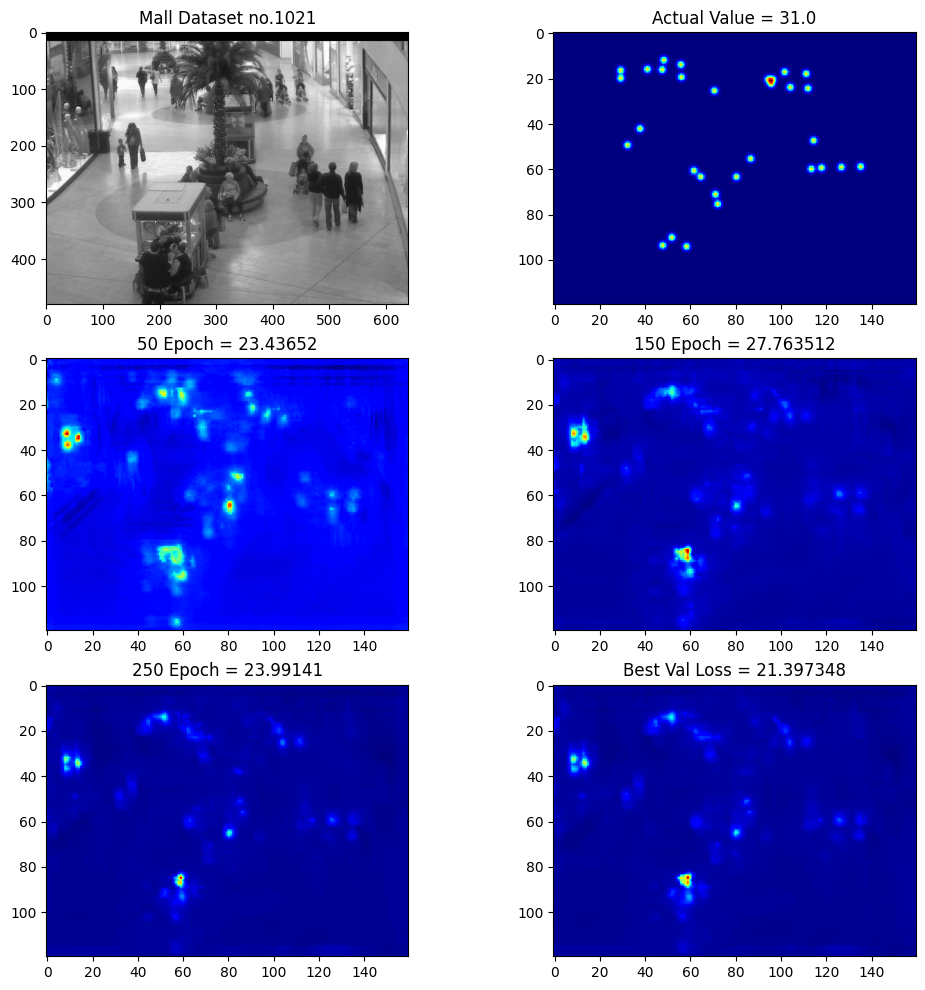

In [53]:
number = random.randint(0, 1999)

ds = MALL_DATASET(Mall_Dataset, aug_val_test)

im, dm = ds[number]
test_50_epoch = tf.identity(model_50_epoch(tf.expand_dims(im, axis=0)))[0]
test_150_epoch = tf.identity(model_150_epoch(tf.expand_dims(im, axis=0)))[0]
test_250_epoch = tf.identity(model_250_epoch(tf.expand_dims(im, axis=0)))[0]
test_best_val_loss = tf.identity(model_best_val_loss(tf.expand_dims(im, axis=0)))[0]

f, axarr = plt.subplots(3, 2, figsize=(12, 12))
axarr[0,0].imshow(im, cmap='gray')
axarr[0,1].imshow(dm, cmap='jet')
axarr[1,0].imshow(test_50_epoch, cmap='jet')
axarr[1,1].imshow(test_150_epoch, cmap='jet')
axarr[2,0].imshow(test_250_epoch, cmap='jet')
axarr[2,1].imshow(test_best_val_loss, cmap='jet')
axarr[0,0].title.set_text('Mall Dataset no.'+str(number))
axarr[0,1].title.set_text('Actual Value = '+str(np.sum(dm)))
axarr[1,0].title.set_text('50 Epoch = '+str(np.sum(test_50_epoch)))
axarr[1,1].title.set_text('150 Epoch = '+str(np.sum(test_150_epoch)))
axarr[2,0].title.set_text('250 Epoch = '+str(np.sum(test_250_epoch)))
axarr[2,1].title.set_text('Best Val Loss = '+str(np.sum(test_best_val_loss)))


In [54]:
epoch_50 = []
epoch_150 = []
epoch_250 = []
best_val_loss = []

gtval = []

ds = MALL_DATASET(Mall_Dataset, aug_val_test)

for im, dm in ds:
    # Predict and sum values
    predval_50 = model_50_epoch(tf.expand_dims(im, axis=0))[0]
    predval_150 = model_150_epoch(tf.expand_dims(im, axis=0))[0]
    predval_250 = model_250_epoch(tf.expand_dims(im, axis=0))[0]
    predval_best_val_loss = model_best_val_loss(tf.expand_dims(im, axis=0))[0]
    epoch_50.append(tf.reduce_sum(predval_50).numpy())
    epoch_150.append(tf.reduce_sum(predval_150).numpy())
    epoch_250.append(tf.reduce_sum(predval_250).numpy())
    best_val_loss.append(tf.reduce_sum(predval_best_val_loss).numpy())
    gtval.append(tf.reduce_sum(dm).numpy())

# Calculate MAE
mae_50 = np.abs(np.subtract(gtval, epoch_50)).mean()
mae_150 = np.abs(np.subtract(gtval, epoch_150)).mean()
mae_250 = np.abs(np.subtract(gtval, epoch_250)).mean()
mae_best_val_loss = np.abs(np.subtract(gtval, best_val_loss)).mean()

# Calculate RMSE
rmse_50 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_50))))
rmse_150 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_150))))
rmse_250 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_250))))
rmse_best_val_loss = np.sqrt(np.mean(np.square(np.subtract(gtval, best_val_loss))))

# Print results with proper formatting
print(f"PART B MAE 50 EPOCH: {mae_50:.5f}")
print(f"PART B MAE 150 EPOCH: {mae_150:.5f}")
print(f"PART B MAE 250 EPOCH: {mae_250:.5f}")
print(f"PART B MAE BEST VAL LOSS: {mae_best_val_loss:.5f}\n")

print(f"PART B RMSE 50 EPOCH: {rmse_50:.5f}")
print(f"PART B RMSE 150 EPOCH: {rmse_150:.5f}")
print(f"PART B RMSE 250 EPOCH: {rmse_250:.5f}")
print(f"PART B RMSE BEST VAL LOSS: {rmse_best_val_loss:.5f}")

PART B MAE 50 EPOCH: 4.39366
PART B MAE 150 EPOCH: 4.24837
PART B MAE 250 EPOCH: 8.40288
PART B MAE BEST VAL LOSS: 11.05945

PART B RMSE 50 EPOCH: 5.33668
PART B RMSE 150 EPOCH: 5.39380
PART B RMSE 250 EPOCH: 9.69868
PART B RMSE BEST VAL LOSS: 11.95491


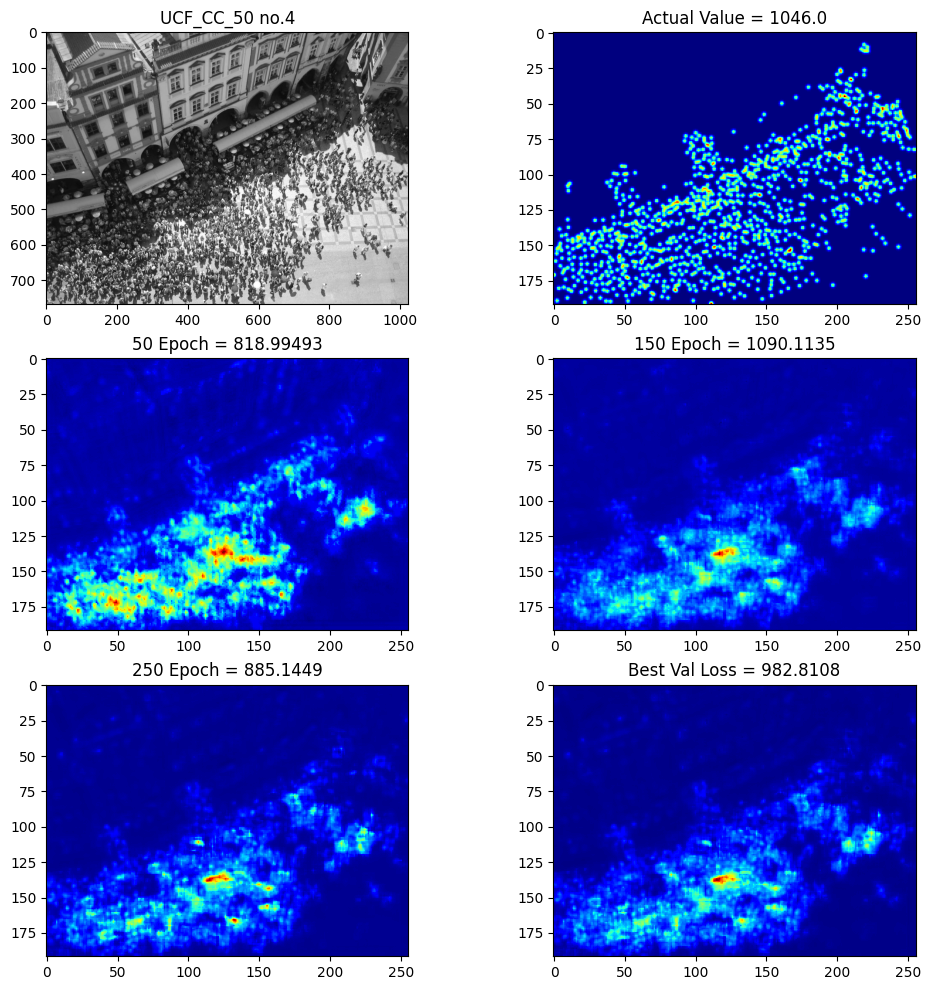

In [55]:
number = random.randint(0, 49)

ds = UCF_CC_50(UCF_CC_50_IMG, aug_val_test)

im, dm = ds[number]
test_50_epoch = tf.identity(model_50_epoch(tf.expand_dims(im, axis=0)))[0]
test_150_epoch = tf.identity(model_150_epoch(tf.expand_dims(im, axis=0)))[0]
test_250_epoch = tf.identity(model_250_epoch(tf.expand_dims(im, axis=0)))[0]
test_best_val_loss = tf.identity(model_best_val_loss(tf.expand_dims(im, axis=0)))[0]

f, axarr = plt.subplots(3, 2, figsize=(12, 12))
axarr[0,0].imshow(im, cmap='gray')
axarr[0,1].imshow(dm, cmap='jet')
axarr[1,0].imshow(test_50_epoch, cmap='jet')
axarr[1,1].imshow(test_150_epoch, cmap='jet')
axarr[2,0].imshow(test_250_epoch, cmap='jet')
axarr[2,1].imshow(test_best_val_loss, cmap='jet')
axarr[0,0].title.set_text('UCF_CC_50 no.'+str(number))
axarr[0,1].title.set_text('Actual Value = '+str(dm.sum()))
axarr[1,0].title.set_text('50 Epoch = '+str(np.sum(test_50_epoch)))
axarr[1,1].title.set_text('150 Epoch = '+str(np.sum(test_150_epoch)))
axarr[2,0].title.set_text('250 Epoch = '+str(np.sum(test_250_epoch)))
axarr[2,1].title.set_text('Best Val Loss = '+str(np.sum(test_best_val_loss)))


In [56]:
epoch_50 = []
epoch_150 = []
epoch_250 = []
best_val_loss = []

gtval = []

ds = UCF_CC_50(UCF_CC_50_IMG, aug_val_test)

for im, dm in ds:
    # Predict and sum values
    predval_50 = model_50_epoch(tf.expand_dims(im, axis=0))[0]
    predval_150 = model_150_epoch(tf.expand_dims(im, axis=0))[0]
    predval_250 = model_250_epoch(tf.expand_dims(im, axis=0))[0]
    predval_best_val_loss = model_best_val_loss(tf.expand_dims(im, axis=0))[0]
    epoch_50.append(tf.reduce_sum(predval_50).numpy())
    epoch_150.append(tf.reduce_sum(predval_150).numpy())
    epoch_250.append(tf.reduce_sum(predval_250).numpy())
    best_val_loss.append(tf.reduce_sum(predval_best_val_loss).numpy())
    gtval.append(tf.reduce_sum(dm).numpy())

# Calculate MAE
mae_50 = np.abs(np.subtract(gtval, epoch_50)).mean()
mae_150 = np.abs(np.subtract(gtval, epoch_150)).mean()
mae_250 = np.abs(np.subtract(gtval, epoch_250)).mean()
mae_best_val_loss = np.abs(np.subtract(gtval, best_val_loss)).mean()

# Calculate RMSE
rmse_50 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_50))))
rmse_150 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_150))))
rmse_250 = np.sqrt(np.mean(np.square(np.subtract(gtval, epoch_250))))
rmse_best_val_loss = np.sqrt(np.mean(np.square(np.subtract(gtval, best_val_loss))))

# Print results with proper formatting
print(f"UCF_CC_50 MAE 50 EPOCH: {mae_50:.5f}")
print(f"UCF_CC_50 MAE 150 EPOCH: {mae_150:.5f}")
print(f"UCF_CC_50 MAE 250 EPOCH: {mae_250:.5f}")
print(f"UCF_CC_50 MAE BEST VAL LOSS: {mae_best_val_loss:.5f}\n")

print(f"UCF_CC_50 RMSE 50 EPOCH: {rmse_50:.5f}")
print(f"UCF_CC_50 RMSE 150 EPOCH: {rmse_150:.5f}")
print(f"UCF_CC_50 RMSE 250 EPOCH: {rmse_250:.5f}")
print(f"UCF_CC_50 RMSE BEST VAL LOSS: {rmse_best_val_loss:.5f}")

UCF_CC_50 MAE 50 EPOCH: 530.74237
UCF_CC_50 MAE 150 EPOCH: 501.53387
UCF_CC_50 MAE 250 EPOCH: 509.61316
UCF_CC_50 MAE BEST VAL LOSS: 511.97449

UCF_CC_50 RMSE 50 EPOCH: 808.11261
UCF_CC_50 RMSE 150 EPOCH: 707.12006
UCF_CC_50 RMSE 250 EPOCH: 743.36554
UCF_CC_50 RMSE BEST VAL LOSS: 725.18018
